# The Price is Right
## Ensemble Agent that will calculate prices

Create a RAG database with 400,000 training data, With vector embeddings using transformer architecture

In [1]:
!pip install python-dotenv

In [2]:
!pip install chromadb

In [3]:
import sys
sys.path.append("/content/drive/MyDrive/Llms/llm_engineering/week8/")

In [4]:
# imports

import os
import re
import math
import json
from tqdm import tqdm
import random
from dotenv import load_dotenv
from huggingface_hub import login
import numpy as np
import pickle
from sentence_transformers import SentenceTransformer
from datasets import load_dataset
import chromadb
from items import Item
from sklearn.manifold import TSNE
import plotly.graph_objects as go

tokenizer_config.json:   0%|          | 0.00/50.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/73.0 [00:00<?, ?B/s]

In [5]:
# environment

load_dotenv(override=True)
os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY', 'your-key-if-not-using-env')
os.environ['HF_TOKEN'] = os.getenv('HF_TOKEN', 'your-key-if-not-using-env')
DB = "products_vectorstore"

In [6]:
# environment

load_dotenv(override=True)

# Set the HF_TOKEN environment variable if it's not already set correctly.
# Replace 'your-actual-huggingface-token' with your real token.
if os.getenv('HF_TOKEN', 'your-key-if-not-using-env') == 'your-key-if-not-using-env':
    os.environ['HF_TOKEN'] = 'your-actual-huggingface-token'

os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY', 'your-key-if-not-using-env')
DB = "products_vectorstore"

In [7]:
## Back to the pkl files

# Let's use the pickle files created earlier. With train.pkl in this folder, you can run this:

# Update the path to point to the correct location in Google Drive
with open('/content/drive/MyDrive/Llms/llm_engineering/train.pkl', 'rb') as file:
    train = pickle.load(file)

In [8]:
train[0].prompt

'How much does this cost to the nearest dollar?\n\nDelphi FG0166 Fuel Pump Module\nDelphi brings 80 years of OE Heritage into each Delphi pump, ensuring quality and fitment for each Delphi part. Part is validated, tested and matched to the right vehicle application Delphi brings 80 years of OE Heritage into each Delphi assembly, ensuring quality and fitment for each Delphi part Always be sure to check and clean fuel tank to avoid unnecessary returns Rigorous OE-testing ensures the pump can withstand extreme temperatures Brand Delphi, Fit Type Vehicle Specific Fit, Dimensions LxWxH 19.7 x 7.7 x 5.1 inches, Weight 2.2 Pounds, Auto Part Position Unknown, Operation Mode Mechanical, Manufacturer Delphi, Model FUEL PUMP, Dimensions 19.7\n\nPrice is $227.00'

# Now create a Chroma Datastore

Now we will create a Chroma datastore with 400,000 products from our training dataset! It's getting real!

Note that we won't be using LangChain, but the API is very straightforward and consistent with before.

In [9]:
client = chromadb.PersistentClient(path=DB)

In [10]:
# Check if the collection exists and delete it if it does
collection_name = "products"

# For old versions of Chroma, use this line instead of the subsequent one
# existing_collection_names = [collection.name for collection in client.list_collections()]
existing_collection_names = client.list_collections()

if collection_name in existing_collection_names:
    client.delete_collection(collection_name)
    print(f"Deleted existing collection: {collection_name}")

collection = client.create_collection(collection_name)

# Introducing the SentenceTransfomer

The all-MiniLM is a very useful model from HuggingFace that maps sentences & paragraphs to a 384 dimensional dense vector space and is ideal for tasks like semantic search.

https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2

It can run pretty quickly locally.

Last time we used OpenAI embeddings to produce vector embeddings. Benefits compared to OpenAI embeddings:
1. It's free and fast!
3. We can run it locally, so the data never leaves our box - might be useful if you're building a personal RAG


In [11]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [12]:
# Pass in a list of texts, get back a numpy array of vectors

vector = model.encode(["Well hi there"])[0]

In [13]:
len(vector)

384

In [14]:
vector

array([-9.46715772e-02,  4.27619442e-02,  5.51620312e-02, -5.10993996e-04,
        1.16203362e-02, -6.80130497e-02,  2.76405867e-02,  6.06974363e-02,
        2.88530476e-02, -1.74128078e-02, -4.94346358e-02,  2.30993405e-02,
       -1.28614195e-02, -4.31402661e-02,  2.17510220e-02,  4.26548906e-02,
        5.10500148e-02, -7.79727176e-02, -1.23247236e-01,  3.67455892e-02,
        4.54117591e-03,  9.47938114e-02, -5.53098843e-02,  1.70641225e-02,
       -2.92873103e-02, -4.47124802e-02,  2.06784438e-02,  6.39320090e-02,
        2.27427520e-02,  4.87789586e-02, -2.33502639e-03,  4.72859293e-02,
       -2.86259074e-02,  2.30624527e-02,  2.45130528e-02,  3.95681784e-02,
       -4.33176123e-02, -1.02316663e-01,  2.79877544e-03,  2.39304509e-02,
        1.61556322e-02, -8.99080746e-03,  2.07255874e-02,  6.40123338e-02,
        6.89179078e-02, -6.98361769e-02,  2.89761275e-03, -8.10989812e-02,
        1.71122756e-02,  2.50652153e-03, -1.06529079e-01, -4.87733260e-02,
       -1.67762339e-02, -

In [15]:
# Utility method - this takes an item and returns it into chunk of texts
def description(item):
    text = item.prompt.replace("How much does this cost to the nearest dollar?\n\n", "")
    return text.split("\n\nPrice is $")[0]

In [16]:
description(train[0])

'Delphi FG0166 Fuel Pump Module\nDelphi brings 80 years of OE Heritage into each Delphi pump, ensuring quality and fitment for each Delphi part. Part is validated, tested and matched to the right vehicle application Delphi brings 80 years of OE Heritage into each Delphi assembly, ensuring quality and fitment for each Delphi part Always be sure to check and clean fuel tank to avoid unnecessary returns Rigorous OE-testing ensures the pump can withstand extreme temperatures Brand Delphi, Fit Type Vehicle Specific Fit, Dimensions LxWxH 19.7 x 7.7 x 5.1 inches, Weight 2.2 Pounds, Auto Part Position Unknown, Operation Mode Mechanical, Manufacturer Delphi, Model FUEL PUMP, Dimensions 19.7'

## Now we populate our RAG datastore

The next cell populates the 400,000 items in Chroma.

Feel free to reduce the number of documents if this takes too long! You can change to:  
`NUMBER_OF_DOCUMENTS = 20000`  
And that's plenty for a perfectly good RAG pipeline.

In [17]:
NUMBER_OF_DOCUMENTS = len(train)

# Uncomment if you'd rather not wait for the full 400,000
# NUMBER_OF_DOCUMENTS = 20000

for i in tqdm(range(0, NUMBER_OF_DOCUMENTS, 1000)):
    documents = [description(item) for item in train[i: i+1000]]
    vectors = model.encode(documents).astype(float).tolist()
    metadatas = [{"category": item.category, "price": item.price} for item in train[i: i+1000]]
    ids = [f"doc_{j}" for j in range(i, i+len(documents))]
    collection.add(
        ids=ids,
        documents=documents,
        embeddings=vectors,
        metadatas=metadatas
    )

100%|██████████| 400/400 [20:44<00:00,  3.11s/it]


## Visualize in 2D

In [18]:
# It is very fun turning this up to 400_000 and seeing the full dataset visualized,
# but it almost crashes my box every time so do that at your own risk!! 10_000 is safe!

MAXIMUM_DATAPOINTS = 30_000

In [19]:
DB = "products_vectorstore"
client = chromadb.PersistentClient(path=DB)

In [20]:
collection = client.get_or_create_collection('products')

In [21]:
CATEGORIES = ['Appliances', 'Automotive', 'Cell_Phones_and_Accessories', 'Electronics','Musical_Instruments', 'Office_Products', 'Tools_and_Home_Improvement', 'Toys_and_Games']
COLORS = ['red', 'blue', 'brown', 'orange', 'yellow', 'green' , 'purple', 'cyan']

In [22]:
# Prework
result = collection.get(include=['embeddings', 'documents', 'metadatas'], limit=MAXIMUM_DATAPOINTS)
vectors = np.array(result['embeddings'])
documents = result['documents']
categories = [metadata['category'] for metadata in result['metadatas']]
colors = [COLORS[CATEGORIES.index(c)] for c in categories]

In [23]:
# Let's try a 2D chart

tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
reduced_vectors = tsne.fit_transform(vectors)

In [24]:

# Create the 2D scatter plot
fig = go.Figure(data=[go.Scatter(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    mode='markers',
    marker=dict(size=3, color=colors, opacity=0.7),
)])

fig.update_layout(
    title='2D Chroma Vectorstore Visualization',
    scene=dict(xaxis_title='x', yaxis_title='y'),
    width=1200,
    height=800,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

## Visualize in 3D

In [25]:
# Let's try 3D!

tsne = TSNE(n_components=3, random_state=42, n_jobs=-1)
reduced_vectors = tsne.fit_transform(vectors)

In [26]:

# Create the 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    z=reduced_vectors[:, 2],
    mode='markers',
    marker=dict(size=3, color=colors, opacity=0.7),
)])

fig.update_layout(
    title='3D Chroma Vector Store Visualization',
    scene=dict(xaxis_title='x', yaxis_title='y', zaxis_title='z'),
    width=1200,
    height=800,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

## Build and test a RAG pipeline with GPT-4o-mini

In [27]:
# imports
from testing import Tester
from openai import OpenAI

In [28]:
import os
from dotenv import load_dotenv

# Load environment variables from .env file if present
load_dotenv(override=True)

# Set default environment variables
os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY', 'your-openai-key-if-not-using-env')
os.environ['HF_TOKEN'] = os.getenv('HF_TOKEN', 'your-hf-token-if-not-using-env')
os.environ['DEEPSEEK_API_KEY'] = os.getenv('DEEPSEEK_API_KEY', 'your-deepseek-key-if-not-using-env')

DB = "products_vectorstore"

# Try to import Google Colab userdata (only works inside Colab)
try:
    from google.colab import userdata
    print("Running in Google Colab, userdata imported.")
except ImportError:
    print("Not running in Google Colab, userdata not imported.")
    userdata = None

# Load secrets if running inside Colab
if userdata:
    openai_api_key = userdata.get('OPENAI_API_KEY')
    deepseek_api_key = userdata.get('DEEPSEEK_API_KEY')

    if openai_api_key:
        os.environ['OPENAI_API_KEY'] = openai_api_key
        print("✅ OpenAI API Key loaded from Colab Secrets.")
    else:
        print("❌ OPENAI_API_KEY not found in Colab Secrets. Using fallback.")

    if deepseek_api_key:
        os.environ['DEEPSEEK_API_KEY'] = deepseek_api_key
        print("✅ DeepSeek API Key loaded from Colab Secrets.")
    else:
        print("❌ DEEPSEEK_API_KEY not found in Colab Secrets. Using fallback.")
else:
    print("📦 Using environment variables (e.g., from .env file or manual setting).")

# Confirm final values (DO NOT PRINT REAL SECRETS IN SHARED NOTEBOOKS)
print(f"OpenAI API Key loaded: {'✔️' if os.getenv('OPENAI_API_KEY') else '❌'}")
print(f"DeepSeek API Key loaded: {'✔️' if os.getenv('DEEPSEEK_API_KEY') else '❌'}")


Running in Google Colab, userdata imported.
✅ OpenAI API Key loaded from Colab Secrets.
✅ DeepSeek API Key loaded from Colab Secrets.
OpenAI API Key loaded: ✔️
DeepSeek API Key loaded: ✔️


In [29]:
openai = OpenAI()

In [30]:
# Load in the test pickle file
# See the section "Back to the PKL files" in the day2.0 notebook
# for instructions on obtaining this test.pkl file

with open('/content/drive/MyDrive/Llms/llm_engineering/test.pkl', 'rb') as file:
    test = pickle.load(file)

In [31]:
# Function to produce content to send to Gpt4O-mini

def make_context(similars, prices):
    message = "To provide some context, here are some other items that might be similar to the item you need to estimate.\n\n"
    for similar, price in zip(similars, prices):                                                # iterate through lists together
        message += f"Potentially related product:\n{similar}\nPrice is ${price:.2f}\n\n"        # related product similar to x price
    return message

In [32]:
# Function that takes items, similar items, and prices, and creates system/user/assistant prompt

def messages_for(item, similars, prices):
    system_message = "You estimate prices of items. Reply only with the price, no explanation"
    user_prompt = make_context(similars, prices)
    user_prompt += "And now the question for you:\n\n"
    user_prompt += item.test_prompt().replace(" to the nearest dollar","").replace("\n\nPrice is $","")
    return [
        {"role": "system", "content": system_message},
        {"role": "user", "content": user_prompt},
        {"role": "assistant", "content": "Price is $"}
    ]

In [33]:
DB = "products_vectorstore"

In [34]:
client = chromadb.PersistentClient(path=DB)
collection = client.get_or_create_collection('products')

In [35]:
# Take an item and strip out the price

def description(item):
    text = item.prompt.replace("How much does this cost to the nearest dollar?\n\n", "")
    return text.split("\n\nPrice is $")[0]

In [36]:
test[0].prompt

"How much does this cost to the nearest dollar?\n\nOEM AC Compressor w/A/C Repair Kit For Ford F150 F-150 V8 & Lincoln Mark LT 2007 2008 - BuyAutoParts NEW\nAs one of the world's largest automotive parts suppliers, our parts are trusted every day by mechanics and vehicle owners worldwide. This A/C Compressor and Components Kit is manufactured and tested to the strictest OE standards for unparalleled performance. Built for trouble-free ownership and 100% visually inspected and quality tested, this A/C Compressor and Components Kit is backed by our 100% satisfaction guarantee. Guaranteed Exact Fit for easy installation 100% BRAND NEW, premium ISO/TS 16949 quality - tested to meet or exceed OEM specifications Engineered for superior durability, backed by industry-leading unlimited-mileage warranty Included in this K\n\nPrice is $374.00"

In [37]:
description(test[0])

"OEM AC Compressor w/A/C Repair Kit For Ford F150 F-150 V8 & Lincoln Mark LT 2007 2008 - BuyAutoParts NEW\nAs one of the world's largest automotive parts suppliers, our parts are trusted every day by mechanics and vehicle owners worldwide. This A/C Compressor and Components Kit is manufactured and tested to the strictest OE standards for unparalleled performance. Built for trouble-free ownership and 100% visually inspected and quality tested, this A/C Compressor and Components Kit is backed by our 100% satisfaction guarantee. Guaranteed Exact Fit for easy installation 100% BRAND NEW, premium ISO/TS 16949 quality - tested to meet or exceed OEM specifications Engineered for superior durability, backed by industry-leading unlimited-mileage warranty Included in this K"

In [38]:
# Load model - SentenceTransformer from HuggingFace thats our vectorizor
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

In [39]:
# Vectorizor function - takes an item, and calls description of that item, and encodes to vector
def vector(item):
    return model.encode([description(item)])

In [40]:
# Function that will return similar items to a provided item

def find_similars(item):
    results = collection.query(query_embeddings=vector(item).astype(float).tolist(), n_results=5)       # Need to turn into floating number instead numpy array, and allowing 5 results back
    documents = results['documents'][0][:]
    prices = [m['price'] for m in results['metadatas'][0][:]]
    return documents, prices

In [41]:
print(test[1].prompt)

How much does this cost to the nearest dollar?

Motorcraft YB3125 Fan Clutch
Motorcraft YB3125 Fan Clutch Package Dimensions 25.146 cms (L) x 20.066 cms (W) x 15.494 cms (H) Package Quantity 1 Product Type Auto Part Country Of Origin China Manufacturer Motorcraft, Brand Motorcraft, Model Fan Clutch, Weight 5 pounds, Dimensions 10 x 7.63 x 6.25 inches, Country of Origin China, model number Exterior Painted, Manufacturer Part Rank Automotive Automotive Replacement Engine Fan Clutches 583, Domestic Shipping can be shipped within U.S., International Shipping This item can be shipped to select countries outside of the U.S. Learn More, Available October 10, 2007

Price is $225.00


In [42]:
documents, prices = find_similars(test[1])

In [43]:
print(make_context(documents, prices))

To provide some context, here are some other items that might be similar to the item you need to estimate.

Potentially related product:
Motorcraft Fan Clutch Assembly - YB3130
Motorcraft Fan Clutch Assembly - YB3130 Package Dimensions 7.23 L x 4 H x 6.92 W (inches) Package Weight 5 pounds Country of Origin China Part Number YB3130 Manufacturer Motorcraft, Brand Motorcraft, Model Fan Clutch Assembly, Weight 5 pounds, Dimensions 6.87 x 7.32 x 5.62 inches, Country of Origin China, model number Exterior Painted, Manufacturer Part Wattage 6.92 watts, Rank Automotive Automotive Replacement Engine Fan Clutches 698, Available October 10, 2007, Dimensions LxWxH 6.87 x 7.32 x 5.62 inches
Price is $223.78

Potentially related product:
Motorcraft- YB3126 Fan Clutch
Fan Clutch Package Dimensions 16.764 H x 24.384 L x 20.32 W (centimeters) Part number YB3126 Package Weight 7.4 pounds Fit type Vehicle Specific Brand Motorcraft, Electric fan design Blower, Power Source Electric, Style Modern, Dimensi

In [44]:
print(messages_for(test[1], documents, prices))

[{'role': 'system', 'content': 'You estimate prices of items. Reply only with the price, no explanation'}, {'role': 'user', 'content': 'To provide some context, here are some other items that might be similar to the item you need to estimate.\n\nPotentially related product:\nMotorcraft Fan Clutch Assembly - YB3130\nMotorcraft Fan Clutch Assembly - YB3130 Package Dimensions 7.23 L x 4 H x 6.92 W (inches) Package Weight 5 pounds Country of Origin China Part Number YB3130 Manufacturer Motorcraft, Brand Motorcraft, Model Fan Clutch Assembly, Weight 5 pounds, Dimensions 6.87 x 7.32 x 5.62 inches, Country of Origin China, model number Exterior Painted, Manufacturer Part Wattage 6.92 watts, Rank Automotive Automotive Replacement Engine Fan Clutches 698, Available October 10, 2007, Dimensions LxWxH 6.87 x 7.32 x 5.62 inches\nPrice is $223.78\n\nPotentially related product:\nMotorcraft- YB3126 Fan Clutch\nFan Clutch Package Dimensions 16.764 H x 24.384 L x 20.32 W (centimeters) Part number YB31

In [45]:
def get_price(s):
    s = s.replace('$','').replace(',','')
    match = re.search(r"[-+]?\d*\.\d+|\d+", s)
    return float(match.group()) if match else 0

In [46]:
get_price("The price for this is $99.99")

99.99

In [47]:
# The function for gpt-4o-mini

def gpt_4o_mini_rag(item):
    documents, prices = find_similars(item)
    response = openai.chat.completions.create(
        model="gpt-4o-mini",
        messages=messages_for(item, documents, prices),
        seed=42,
        max_tokens=5
    )
    reply = response.choices[0].message.content
    return get_price(reply)

In [48]:
gpt_4o_mini_rag(test[1])

198.45

In [49]:
test[1].price

225.11

1: Guess: $312.41 Truth: $374.41 Error: $62.00 SLE: 0.03 Item: OEM AC Compressor w/A/C Repair Kit For F...
2: Guess: $198.45 Truth: $225.11 Error: $26.66 SLE: 0.02 Item: Motorcraft YB3125 Fan Clutch
3: Guess: $44.99 Truth: $61.68 Error: $16.69 SLE: 0.10 Item: Dorman 603-159 Front Washer Fluid Reserv...
4: Guess: $449.99 Truth: $599.99 Error: $150.00 SLE: 0.08 Item: HP Premium 17.3-inch HD Plus Touchscreen...
5: Guess: $19.99 Truth: $16.99 Error: $3.00 SLE: 0.02 Item: 5-Position Super Switch Pickup Selector ...
6: Guess: $12.99 Truth: $31.99 Error: $19.00 SLE: 0.74 Item: Horror Bookmarks, Resin Horror Bookmarks...
7: Guess: $68.99 Truth: $101.79 Error: $32.80 SLE: 0.15 Item: SK6241 - Stinger 4 Gauge 6000 Series Pow...
8: Guess: $399.00 Truth: $289.00 Error: $110.00 SLE: 0.10 Item: Godox ML60Bi LED Light Kit, Handheld LED...
9: Guess: $599.99 Truth: $635.86 Error: $35.87 SLE: 0.00 Item: Randall RG75DG3PLUS G3 Plus 100-Watt Com...
10: Guess: $56.99 Truth: $65.99 Error: $9.00 SLE: 0.02 Ite

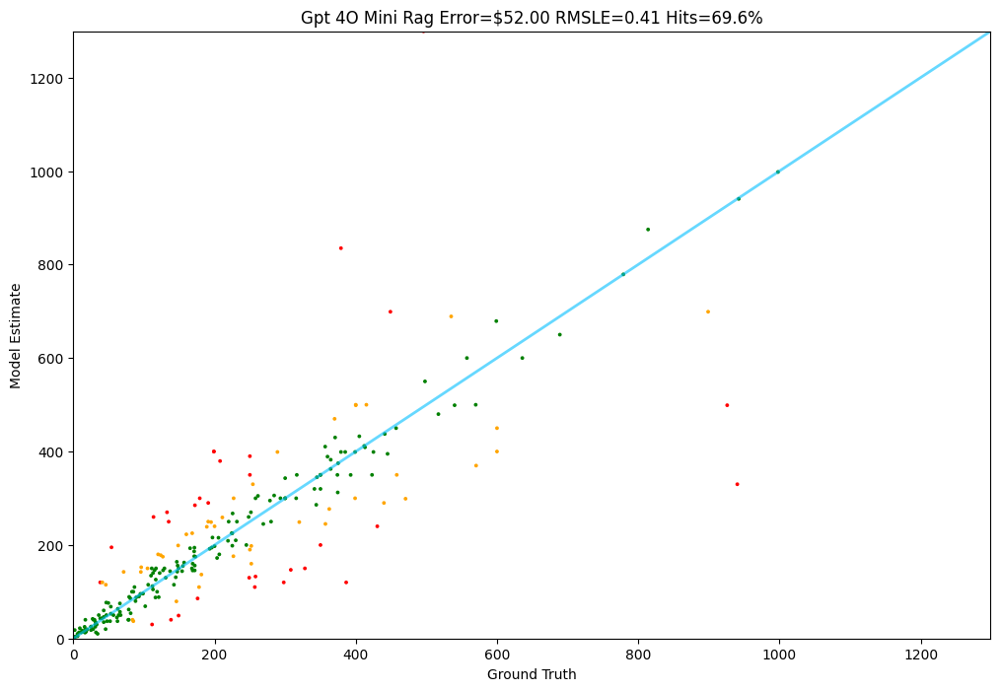

In [50]:
Tester.test(gpt_4o_mini_rag, test)

## Extra: Trying a DeepSeek API call instead of OpenAI

In [51]:
# Connect to DeepSeek using the OpenAI client python library

deepseek_api_key = os.getenv("DEEPSEEK_API_KEY")
deepseek_via_openai_client = OpenAI(api_key=deepseek_api_key,base_url="https://api.deepseek.com")

In [52]:
# Added some retry logic here because DeepSeek is very oversubscribed and sometimes fails..

def deepseek_api_rag(item):
    documents, prices = find_similars(item)
    retries = 8
    done = False
    reply = "" # Initialize reply with a default value
    while not done and retries > 0:
        try:
            response = deepseek_via_openai_client.chat.completions.create(
                model="deepseek-chat",
                messages=messages_for(item, documents, prices),
                seed=42,
                max_tokens=8
            )
            reply = response.choices[0].message.content
            done = True
        except Exception as e:
            print(f"Error: {e}")
            retries -= 1
    return get_price(reply)

In [53]:
deepseek_api_rag(test[1])

210.45

1: Guess: $323.41 Truth: $374.41 Error: $51.00 SLE: 0.02 Item: OEM AC Compressor w/A/C Repair Kit For F...
2: Guess: $210.45 Truth: $225.11 Error: $14.66 SLE: 0.00 Item: Motorcraft YB3125 Fan Clutch
3: Guess: $0.00 Truth: $61.68 Error: $61.68 SLE: 17.12 Item: Dorman 603-159 Front Washer Fluid Reserv...
4: Guess: $449.99 Truth: $599.99 Error: $150.00 SLE: 0.08 Item: HP Premium 17.3-inch HD Plus Touchscreen...
5: Guess: $19.99 Truth: $16.99 Error: $3.00 SLE: 0.02 Item: 5-Position Super Switch Pickup Selector ...
6: Guess: $12.99 Truth: $31.99 Error: $19.00 SLE: 0.74 Item: Horror Bookmarks, Resin Horror Bookmarks...
7: Guess: $68.99 Truth: $101.79 Error: $32.80 SLE: 0.15 Item: SK6241 - Stinger 4 Gauge 6000 Series Pow...
8: Guess: $399.00 Truth: $289.00 Error: $110.00 SLE: 0.10 Item: Godox ML60Bi LED Light Kit, Handheld LED...
9: Guess: $0.00 Truth: $635.86 Error: $635.86 SLE: 41.69 Item: Randall RG75DG3PLUS G3 Plus 100-Watt Com...
10: Guess: $59.99 Truth: $65.99 Error: $6.00 SLE: 0.01 Ite

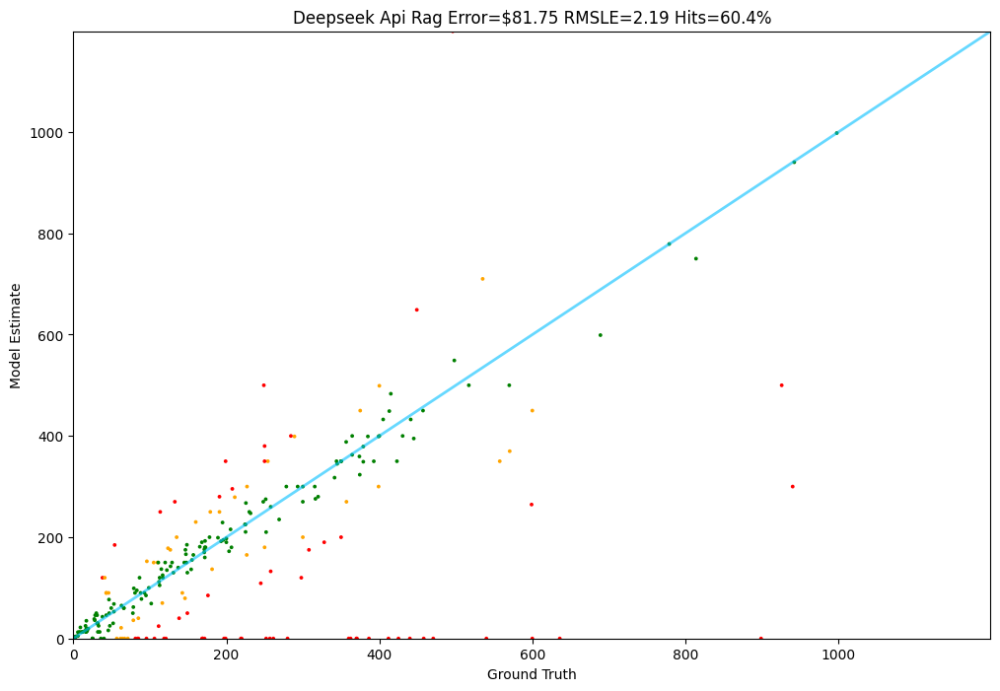

In [54]:
Tester.test(deepseek_api_rag, test)

## And now to wrap this in an "Agent"

Turning this into a production ready code

In [55]:
from agents.frontier_agent import FrontierAgent

In [56]:
# Let's print the logs so we can see what's going on

import logging
root = logging.getLogger()
root.setLevel(logging.INFO)

In [57]:
agent = FrontierAgent(collection)

INFO:root:[Frontier Agent] Initializing Frontier Agent
INFO:root:[Frontier Agent] Frontier Agent is set up with DeepSeek
INFO:sentence_transformers.SentenceTransformer:Use pytorch device_name: cuda:0
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/all-MiniLM-L6-v2
INFO:root:[Frontier Agent] Frontier Agent is ready


In [58]:
agent.price("Quadcast HyperX condenser mic for high quality podcasting")

INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $154.59


154.59

In [59]:
!pip install modal

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 2.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 574.3/574.3 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 9.5 MB/s eta 0:00:00
  Created wheel for grpclib: filename=grpclib-0.4.7-py3-none-any.whl size=76260 sha256=f24b90037bda73fb0f0aa44169528c0f0403aa221c63c6ac487c0537713ce150
  Stored in directory: /root/.cache/pip/wheels/1a/6e/f8/47a179a8cf84417e94206ee7bdee3cc4219a011e6ca1973eb0
Successfully built grpclib
  Attempting uninstall: click
    Found existing installation: click 8.2.0
    Uninstalling click-8.2.0:
      Successfully uninstalled click-8.2.0
  Attempting uninstall: grpclib
    Found existing installation: grpclib 0.4.8
    Uninstalling grpclib-0.4.8:
  

In [60]:
import os

os.environ["MODAL_TOKEN_ID"] = "ak-w7aQgtQcZLMoS572GLJbYO"
os.environ["MODAL_TOKEN_SECRET"] = "as-glUrinev5HVUcOeRpuTXQh"

from agents.specialist_agent import SpecialistAgent

In [61]:
agent2 = SpecialistAgent()

INFO:root:[Specialist Agent] Specialist Agent is initializing - connecting to modal
INFO:root:[Specialist Agent] Specialist Agent is ready


In [62]:
agent2.price("Quadcast HyperX condenser mic for high quality podcasting")

INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00


189.0

 ## Bring back Random Forest pricer

Previously created model

In [63]:
import sys
sys.path.append("/content/drive/MyDrive/Llms/llm_engineering/week8")

In [64]:
# imports

import os
import re
import math
import json
from tqdm import tqdm
import random
from dotenv import load_dotenv
from huggingface_hub import login
import numpy as np
import pickle
from openai import OpenAI
from sentence_transformers import SentenceTransformer
from datasets import load_dataset
import chromadb
from items import Item
from testing import Tester
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import joblib

In [65]:
# CONSTANTS

QUESTION = "How much does this cost to the nearest dollar?\n\n"
DB = "products_vectorstore"

In [66]:
client = chromadb.PersistentClient(path=DB)
collection = client.get_or_create_collection('products')

In [67]:
result = collection.get(include=['embeddings', 'documents', 'metadatas'])
vectors = np.array(result['embeddings'])
documents = result['documents']
prices = [metadata['price'] for metadata in result['metadatas']]

# Random Forest

We will now train a Random Forest model.

In [68]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_model.fit(vectors, prices)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [69]:
# Save the model to a file

joblib.dump(rf_model, 'random_forest_model.pkl')

['random_forest_model.pkl']

In [70]:
# Load it back in again

rf_model = joblib.load('random_forest_model.pkl')

In [71]:
from agents.specialist_agent import SpecialistAgent
from agents.frontier_agent import FrontierAgent
from agents.random_forest_agent import RandomForestAgent

In [72]:
specialist = SpecialistAgent()
frontier = FrontierAgent(collection)
random_forest = RandomForestAgent()

INFO:root:[Specialist Agent] Specialist Agent is initializing - connecting to modal
INFO:root:[Specialist Agent] Specialist Agent is ready
INFO:root:[Frontier Agent] Initializing Frontier Agent
INFO:root:[Frontier Agent] Frontier Agent is set up with DeepSeek
INFO:sentence_transformers.SentenceTransformer:Use pytorch device_name: cuda:0
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/all-MiniLM-L6-v2
INFO:root:[Frontier Agent] Frontier Agent is ready
INFO:root:[Random Forest Agent] Random Forest Agent is initializing
INFO:sentence_transformers.SentenceTransformer:Use pytorch device_name: cuda:0
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/all-MiniLM-L6-v2
INFO:root:[Random Forest Agent] Random Forest Agent is ready


In [73]:
def description(item):
    return item.prompt.split("to the nearest dollar?\n\n")[1].split("\n\nPrice is $")[0]

In [74]:
def rf(item):
    return random_forest.price(description(item))

INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $287.56
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


1: Guess: $287.56 Truth: $374.41 Error: $86.85 SLE: 0.07 Item: OEM AC Compressor w/A/C Repair Kit For F...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $200.81
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


2: Guess: $200.81 Truth: $225.11 Error: $24.30 SLE: 0.01 Item: Motorcraft YB3125 Fan Clutch


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $209.71
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


3: Guess: $209.71 Truth: $61.68 Error: $148.03 SLE: 1.47 Item: Dorman 603-159 Front Washer Fluid Reserv...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $362.57
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


4: Guess: $362.57 Truth: $599.99 Error: $237.42 SLE: 0.25 Item: HP Premium 17.3-inch HD Plus Touchscreen...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.87
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


5: Guess: $208.87 Truth: $16.99 Error: $191.88 SLE: 6.04 Item: 5-Position Super Switch Pickup Selector ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $57.31
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


6: Guess: $57.31 Truth: $31.99 Error: $25.32 SLE: 0.32 Item: Horror Bookmarks, Resin Horror Bookmarks...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $273.30
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


7: Guess: $273.30 Truth: $101.79 Error: $171.51 SLE: 0.96 Item: SK6241 - Stinger 4 Gauge 6000 Series Pow...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $229.88
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


8: Guess: $229.88 Truth: $289.00 Error: $59.12 SLE: 0.05 Item: Godox ML60Bi LED Light Kit, Handheld LED...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $302.75
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


9: Guess: $302.75 Truth: $635.86 Error: $333.11 SLE: 0.55 Item: Randall RG75DG3PLUS G3 Plus 100-Watt Com...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $191.76
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


10: Guess: $191.76 Truth: $65.99 Error: $125.77 SLE: 1.12 Item: HOLDWILL 6 Pack LED Shop Light, 4FT 24W ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $295.68
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


11: Guess: $295.68 Truth: $254.21 Error: $41.47 SLE: 0.02 Item: Viking Horns V103C/1005ATK 3 Gallon Air ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.30
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


12: Guess: $274.30 Truth: $412.99 Error: $138.69 SLE: 0.17 Item: CURT 70110 Custom Tow Bar Base Plate Bra...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $184.18
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


13: Guess: $184.18 Truth: $205.50 Error: $21.32 SLE: 0.01 Item: 10-Pack Solar HAMMERED BRONZE Finish Pos...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $280.46
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


14: Guess: $280.46 Truth: $248.23 Error: $32.23 SLE: 0.01 Item: COSTWAY Electric Tumble Dryer, Sliver


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $300.78
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


15: Guess: $300.78 Truth: $399.00 Error: $98.22 SLE: 0.08 Item: FREE SIGNAL TV Transit 32" 12 Volt DC Po...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $349.20
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


16: Guess: $349.20 Truth: $373.94 Error: $24.74 SLE: 0.00 Item: Bilstein 5100 Monotube Gas Shock Set com...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $258.73
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


17: Guess: $258.73 Truth: $92.89 Error: $165.84 SLE: 1.04 Item: Sangean K-200 Multi-Function Upright AM/...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $115.09
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


18: Guess: $115.09 Truth: $51.99 Error: $63.10 SLE: 0.62 Item: Charles Leonard Magnetic Lapboard Class ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $448.04
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


19: Guess: $448.04 Truth: $179.00 Error: $269.04 SLE: 0.84 Item: Gigabyte AMD Radeon HD 7870 2 GB GDDR5 D...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $70.14
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


20: Guess: $70.14 Truth: $19.42 Error: $50.72 SLE: 1.56 Item: 3dRose LLC 8 x 8 x 0.25 Inches Bull Terr...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $308.31
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


21: Guess: $308.31 Truth: $539.95 Error: $231.64 SLE: 0.31 Item: ROKINON 85mm F1.4 Auto Focus Full Frame ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $217.38
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


22: Guess: $217.38 Truth: $147.67 Error: $69.71 SLE: 0.15 Item: AUTOSAVER88 Headlight Assembly Compatibl...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $163.62
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


23: Guess: $163.62 Truth: $24.99 Error: $138.63 SLE: 3.41 Item: ASI NAUTICAL 2.5 Inches Opera Glasses Bi...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $273.17
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


24: Guess: $273.17 Truth: $149.00 Error: $124.17 SLE: 0.36 Item: Behringer TUBE OVERDRIVE TO100 Authentic...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $50.11
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


25: Guess: $50.11 Truth: $16.99 Error: $33.12 SLE: 1.09 Item: Fun Express Insect Finger Puppets - 24 f...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $74.64
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


26: Guess: $74.64 Truth: $7.99 Error: $66.65 SLE: 4.54 Item: WAFJAMF Roller Stamp Identity Theft Stam...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $193.73
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


27: Guess: $193.73 Truth: $199.99 Error: $6.26 SLE: 0.00 Item: Capulina Tiffany Floor Lamp 2-Light 16" ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.82
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


28: Guess: $274.82 Truth: $251.45 Error: $23.37 SLE: 0.01 Item: Apple Watch Series 6 (GPS, 44mm) - Space...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.22
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


29: Guess: $235.22 Truth: $231.62 Error: $3.60 SLE: 0.00 Item: ICON 01725 Tandem Axle Fender Skirt FS17...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.23
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


30: Guess: $236.23 Truth: $135.00 Error: $101.23 SLE: 0.31 Item: SanDisk 128GB Ultra (10 Pack) MicroSD Cl...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $295.94
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


31: Guess: $295.94 Truth: $356.62 Error: $60.68 SLE: 0.03 Item: Velvac 2020,L,C/Hr,W,E2003,102",Bk - 715...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $221.39
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


32: Guess: $221.39 Truth: $257.99 Error: $36.60 SLE: 0.02 Item: TCMT Passenger Backrest Sissy Bar & Lugg...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $180.30
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


33: Guess: $180.30 Truth: $27.99 Error: $152.31 SLE: 3.36 Item: Alnicov 63.5MM Brass Tremolo Block，Tremo...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $266.65
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


34: Guess: $266.65 Truth: $171.20 Error: $95.45 SLE: 0.19 Item: Subaru Forester Outback Legacy OEM Engin...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.43
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


35: Guess: $235.43 Truth: $225.00 Error: $10.43 SLE: 0.00 Item: Richmond Auto Upholstery - 2012 Dodge Ra...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $196.05
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


36: Guess: $196.05 Truth: $105.00 Error: $91.05 SLE: 0.38 Item: AP-39 Automotive Paint Primer Grey 2K Ur...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.80
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


37: Guess: $236.80 Truth: $299.99 Error: $63.19 SLE: 0.06 Item: Road Top Wireless Carplay Retrofit Kit D...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $662.85
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


38: Guess: $662.85 Truth: $535.09 Error: $127.76 SLE: 0.05 Item: Gibson Performance Exhaust 5658 Aluminiz...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $136.40
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


39: Guess: $136.40 Truth: $12.33 Error: $124.07 SLE: 5.44 Item: Bella Tunno Happy Links - Baby Montessor...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $203.42
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


40: Guess: $203.42 Truth: $84.99 Error: $118.43 SLE: 0.75 Item: CANMORE H300 Handheld GPS Golf Device, S...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $91.55
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


41: Guess: $91.55 Truth: $15.99 Error: $75.56 SLE: 2.87 Item: DCPOWER AC Adapter Compatible Replacemen...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $153.72
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


42: Guess: $153.72 Truth: $62.44 Error: $91.28 SLE: 0.79 Item: Sharp, VX2128V, Commercial Desktop Calcu...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $118.23
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


43: Guess: $118.23 Truth: $82.99 Error: $35.24 SLE: 0.12 Item: Melissa & Doug Lifelike Plush Stork Gian...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $322.38
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


44: Guess: $322.38 Truth: $599.95 Error: $277.57 SLE: 0.38 Item: Sony SSCS8 2-Way 3-Driver Center Channel...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $294.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


45: Guess: $294.95 Truth: $194.99 Error: $99.96 SLE: 0.17 Item: ASUS Chromebook CX1, 14" Full HD NanoEdg...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $311.66
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


46: Guess: $311.66 Truth: $344.95 Error: $33.29 SLE: 0.01 Item: FiiO X7 32GB Hi-Res Lossless Music Playe...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $46.08
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


47: Guess: $46.08 Truth: $37.99 Error: $8.09 SLE: 0.04 Item: TORRO Leather Case Compatible with iPhon...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $228.14
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


48: Guess: $228.14 Truth: $224.35 Error: $3.79 SLE: 0.00 Item: Universal Air Conditioner KT 1031 A/C Co...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $746.56
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


49: Guess: $746.56 Truth: $814.00 Error: $67.44 SLE: 0.01 Item: Street Series Stainless Performance Cat-...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $487.41
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


50: Guess: $487.41 Truth: $439.88 Error: $47.53 SLE: 0.01 Item: Lenovo IdeaPad 3 14-inch Laptop, 14.0-in...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $310.11
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


51: Guess: $310.11 Truth: $341.43 Error: $31.32 SLE: 0.01 Item: Access Bed Covers TonnoSport 22050219 - ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.81
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


52: Guess: $208.81 Truth: $46.78 Error: $162.03 SLE: 2.19 Item: G.I. JOE Hasbro 3 3/4" Wave 5 Action Fig...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $152.83
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


53: Guess: $152.83 Truth: $171.44 Error: $18.61 SLE: 0.01 Item: T&S Brass B-0232-BST Double Pantry Fauce...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $275.54
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


54: Guess: $275.54 Truth: $458.00 Error: $182.46 SLE: 0.26 Item: ZTUOAUMA Fuel Injection Pump 3090942 309...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $234.06
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


55: Guess: $234.06 Truth: $130.75 Error: $103.31 SLE: 0.34 Item: 2AP18AA#ABA Hp Prime Graphing Calculator...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $190.63
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


56: Guess: $190.63 Truth: $83.81 Error: $106.82 SLE: 0.66 Item: Lowrance 000-0119-83 Nmea 2000 25' Exten...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $166.11
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


57: Guess: $166.11 Truth: $386.39 Error: $220.28 SLE: 0.71 Item: Jeep Genuine Accessories 82213051 Hood L...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $222.86
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


58: Guess: $222.86 Truth: $169.00 Error: $53.86 SLE: 0.08 Item: GODOX CB-06 Hard Carrying Case with Whee...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $141.16
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


59: Guess: $141.16 Truth: $17.95 Error: $123.21 SLE: 4.06 Item: Au-Tomotive Gold, INC. Ford Black Valet ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $233.86
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


60: Guess: $233.86 Truth: $269.00 Error: $35.14 SLE: 0.02 Item: Snailfly Black Roof Rack Rail + Cross Ba...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $224.29
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


61: Guess: $224.29 Truth: $77.77 Error: $146.52 SLE: 1.10 Item: KING SHA Anti Glare LED Track Lighting H...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $191.43
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


62: Guess: $191.43 Truth: $88.99 Error: $102.44 SLE: 0.58 Item: APS Compatible with Chevy Silverado 1500...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $221.45
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


63: Guess: $221.45 Truth: $364.41 Error: $142.96 SLE: 0.25 Item: Wilwood Engineering 14011291R Brake Cali...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $145.27
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


64: Guess: $145.27 Truth: $127.03 Error: $18.24 SLE: 0.02 Item: ACDelco Gold 336-1925A Starter, Remanufa...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $634.48
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


65: Guess: $634.48 Truth: $778.95 Error: $144.47 SLE: 0.04 Item: UWS EC10783 69-Inch Matte Black Heavy-Wa...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $462.69
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


66: Guess: $462.69 Truth: $206.66 Error: $256.03 SLE: 0.65 Item: Dell Latitude E5440 14in Business Laptop...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $183.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


67: Guess: $183.95 Truth: $35.94 Error: $148.01 SLE: 2.59 Item: (Plug and Play) Spare Tire Brake Light W...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.22
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


68: Guess: $239.22 Truth: $149.00 Error: $90.22 SLE: 0.22 Item: The Ultimate Roadside Rescue Assistant


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.16
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


69: Guess: $208.16 Truth: $251.98 Error: $43.82 SLE: 0.04 Item: Brand New 18" x 8.5" Replacement Wheel f...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $247.57
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


70: Guess: $247.57 Truth: $160.00 Error: $87.57 SLE: 0.19 Item: Headlight Headlamp LH Left & RH Right Pa...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $120.87
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


71: Guess: $120.87 Truth: $39.99 Error: $80.88 SLE: 1.19 Item: Lilo And Stitch Deluxe Oversize Print La...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $246.37
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


72: Guess: $246.37 Truth: $362.41 Error: $116.04 SLE: 0.15 Item: AC Compressor & A/C Clutch For Hyundai A...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.04
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


73: Guess: $236.04 Truth: $344.00 Error: $107.96 SLE: 0.14 Item: House Of Troy PIN475-AB Pinnacle Collect...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $181.87
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


74: Guess: $181.87 Truth: $25.09 Error: $156.78 SLE: 3.79 Item: Juno T29 WH Floating Electrical Feed Sin...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $172.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


75: Guess: $172.97 Truth: $175.95 Error: $2.98 SLE: 0.00 Item: Sherman GO-PARTS - for 2013-2016 Toyota ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.73
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


76: Guess: $235.73 Truth: $132.64 Error: $103.09 SLE: 0.33 Item: Roland RPU-3 Electronic Keyboard Pedal o...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $281.89
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


77: Guess: $281.89 Truth: $422.99 Error: $141.10 SLE: 0.16 Item: Rockland VMI14 12,000 Pound 12 Volt DC E...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $167.40
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


78: Guess: $167.40 Truth: $146.48 Error: $20.92 SLE: 0.02 Item: Max Advanced Brakes Elite XDS Front Cros...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $187.93
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


79: Guess: $187.93 Truth: $156.83 Error: $31.10 SLE: 0.03 Item: Quality-Built 11030 Premium Quality Alte...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $378.40
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


80: Guess: $378.40 Truth: $251.99 Error: $126.41 SLE: 0.16 Item: Lucida LG-510 Student Classical Guitar, ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.19
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


81: Guess: $239.19 Truth: $940.33 Error: $701.14 SLE: 1.87 Item: Longacre 52-79800 Aluminum Turn Plates


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $181.72
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


82: Guess: $181.72 Truth: $52.99 Error: $128.73 SLE: 1.49 Item: Motion Pro 08-0380 Adjustable Torque Wre...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $256.93
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


83: Guess: $256.93 Truth: $219.95 Error: $36.98 SLE: 0.02 Item: Glyph Thunderbolt 3 NVMe Dock (0 GB)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $283.68
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


84: Guess: $283.68 Truth: $441.03 Error: $157.35 SLE: 0.19 Item: TOYO Open Country MT Performance Radial ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $238.22
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


85: Guess: $238.22 Truth: $168.98 Error: $69.24 SLE: 0.12 Item: Razer Seiren X USB Streaming Microphone ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $32.11
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


86: Guess: $32.11 Truth: $2.49 Error: $29.62 SLE: 5.06 Item: Happy Birthday to Dad From Your Daughter...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $189.16
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


87: Guess: $189.16 Truth: $98.62 Error: $90.54 SLE: 0.42 Item: Little Tikes My Real Jam First Concert S...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.03
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


88: Guess: $227.03 Truth: $256.95 Error: $29.92 SLE: 0.02 Item: Studio M Peace and Harmony Art Pole Comm...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $180.72
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


89: Guess: $180.72 Truth: $30.99 Error: $149.73 SLE: 3.02 Item: MyVolts 12V Power Supply Adaptor Compati...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $356.62
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


90: Guess: $356.62 Truth: $569.84 Error: $213.22 SLE: 0.22 Item: Dell Latitude 7212 Rugged Extreme Tablet...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.65
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


91: Guess: $208.65 Truth: $177.99 Error: $30.66 SLE: 0.03 Item: Covermates Contour Fit Car Cover - Light...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $645.37
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


92: Guess: $645.37 Truth: $997.99 Error: $352.62 SLE: 0.19 Item: Westin 57-4025 Black HDX Grille Guard fi...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $232.68
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


93: Guess: $232.68 Truth: $219.00 Error: $13.68 SLE: 0.00 Item: Fieldpiece JL2 Job Link Wireless App Tra...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $280.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


94: Guess: $280.97 Truth: $225.55 Error: $55.42 SLE: 0.05 Item: hansgrohe Talis S Modern Premium Easy Cl...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $323.24
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


95: Guess: $323.24 Truth: $495.95 Error: $172.71 SLE: 0.18 Item: G-Technology G-SPEED eS PRO High-Perform...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $762.13
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


96: Guess: $762.13 Truth: $942.37 Error: $180.24 SLE: 0.04 Item: DreamLine SHDR-1960723L-01 Shower Door, ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $153.96
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


97: Guess: $153.96 Truth: $1.94 Error: $152.02 SLE: 15.72 Item: Sanctuary Square Backplate Finish: Oiled...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $278.06
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


98: Guess: $278.06 Truth: $284.34 Error: $6.28 SLE: 0.00 Item: Pelican Protector 1750 Long Case - Multi...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $219.11
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


99: Guess: $219.11 Truth: $171.90 Error: $47.21 SLE: 0.06 Item: Brock Replacement Driver and Passenger H...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.54
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


100: Guess: $227.54 Truth: $144.99 Error: $82.55 SLE: 0.20 Item: Carlinkit Ai Box Mini, Android 11, Multi...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $253.54
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


101: Guess: $253.54 Truth: $470.47 Error: $216.93 SLE: 0.38 Item: StarDot NetCamLIVE2 YouTube Live Stream ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $220.44
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


102: Guess: $220.44 Truth: $66.95 Error: $153.49 SLE: 1.40 Item: Atomic Compatible FILXXCAR0016 16x25x5 M...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $127.40
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


103: Guess: $127.40 Truth: $117.00 Error: $10.40 SLE: 0.01 Item: Bandai Awakening of S. H. s.h.figuarts s...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $240.53
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


104: Guess: $240.53 Truth: $172.14 Error: $68.39 SLE: 0.11 Item: Fit System 62135G Passenger Side Towing ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $284.68
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


105: Guess: $284.68 Truth: $392.74 Error: $108.06 SLE: 0.10 Item: Black Horse Black Aluminum Exceed Runnin...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $53.27
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


106: Guess: $53.27 Truth: $16.99 Error: $36.28 SLE: 1.22 Item: Dearsun Twinkle Star Color Night Light P...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $70.28
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


107: Guess: $70.28 Truth: $1.34 Error: $68.94 SLE: 11.67 Item: Pokemon - Gallade Spirit Link (83/108) -...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $337.87
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


108: Guess: $337.87 Truth: $349.98 Error: $12.11 SLE: 0.00 Item: Ibanez GA34STCE-NT GIO Series Classical ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $255.41
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


109: Guess: $255.41 Truth: $370.71 Error: $115.30 SLE: 0.14 Item: Set 2 Heavy Duty 12-16.5 12x16.5 12 Ply ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $142.61
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


110: Guess: $142.61 Truth: $65.88 Error: $76.73 SLE: 0.58 Item: Hairpin Table Legs 28" Heavy Duty Hairpi...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $226.34
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


111: Guess: $226.34 Truth: $229.99 Error: $3.65 SLE: 0.00 Item: Marada Racing Seat with Adjustable Slide...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $138.73
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


112: Guess: $138.73 Truth: $9.14 Error: $129.59 SLE: 6.88 Item: Remington Industries 24UL1007STRWHI25 24...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $501.65
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


113: Guess: $501.65 Truth: $199.00 Error: $302.65 SLE: 0.85 Item: Acer S3-391-6046 13.3-inch Ultrabook, In...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $266.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


114: Guess: $266.00 Truth: $109.99 Error: $156.01 SLE: 0.77 Item: ICBEAMER 7" RGB LED Headlights Bulb Halo...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $383.88
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


115: Guess: $383.88 Truth: $570.42 Error: $186.54 SLE: 0.16 Item: R1 Concepts Front Rear Brakes and Rotors...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $277.96
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


116: Guess: $277.96 Truth: $279.99 Error: $2.03 SLE: 0.00 Item: Camplux 2.64 GPM Tankless , Outdoor Port...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $122.29
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


117: Guess: $122.29 Truth: $30.99 Error: $91.30 SLE: 1.82 Item: KNOKLOCK 10 Pack 3.75 Inch(96mm) Kitchen...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $232.17
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


118: Guess: $232.17 Truth: $31.99 Error: $200.18 SLE: 3.82 Item: Valley Enterprises Yaesu USB FTDI CT-62 ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $164.57
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


119: Guess: $164.57 Truth: $15.90 Error: $148.67 SLE: 5.21 Item: G9 LED Light Bulbs，8W，75W 100W replaceme...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $139.14
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


120: Guess: $139.14 Truth: $45.99 Error: $93.15 SLE: 1.19 Item: ZCHAOZ 4 Lights Antique White Farmhouse ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $200.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


121: Guess: $200.95 Truth: $113.52 Error: $87.43 SLE: 0.32 Item: Honeywell TH8320R1003 Honeywell VisionPr...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $302.02
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


122: Guess: $302.02 Truth: $516.99 Error: $214.97 SLE: 0.29 Item: Patriot Exhaust H8013-1 1-7/8" Clippster...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $209.64
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


123: Guess: $209.64 Truth: $196.99 Error: $12.65 SLE: 0.00 Item: Fitrite Autopart New Front Left Driver S...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $156.43
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


124: Guess: $156.43 Truth: $46.55 Error: $109.88 SLE: 1.43 Item: Technical Precision Replacement for GE G...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $289.76
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


125: Guess: $289.76 Truth: $356.99 Error: $67.23 SLE: 0.04 Item: Covercraft Carhartt SeatSaver Front Row ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $234.28
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


126: Guess: $234.28 Truth: $319.95 Error: $85.67 SLE: 0.10 Item: Sennheiser SD Pro 2 (506008) - Double-Si...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $151.20
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


127: Guess: $151.20 Truth: $96.06 Error: $55.14 SLE: 0.20 Item: Hitachi MAF0110 Mass Air Flow Sensor


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $262.88
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


128: Guess: $262.88 Truth: $190.99 Error: $71.89 SLE: 0.10 Item: AmScope SE305R-P-LED-PS36A 10X-30X LED C...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $193.53
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


129: Guess: $193.53 Truth: $257.95 Error: $64.42 SLE: 0.08 Item: Front Left Driver Side Window Regulator ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $186.93
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


130: Guess: $186.93 Truth: $62.95 Error: $123.98 SLE: 1.16 Item: Premium Replica Hubcap Set, Fits Nissan ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $52.23
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


131: Guess: $52.23 Truth: $47.66 Error: $4.57 SLE: 0.01 Item: Excellerations Phonics Spelling Game for...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $272.34
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


132: Guess: $272.34 Truth: $226.99 Error: $45.35 SLE: 0.03 Item: RC4WD BigDog Dual Axle Scale Car/Truck T...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $276.66
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


133: Guess: $276.66 Truth: $359.95 Error: $83.29 SLE: 0.07 Item: Unknown Stage 2 Clutch Kit - Low Altitud...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $267.35
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


134: Guess: $267.35 Truth: $78.40 Error: $188.95 SLE: 1.48 Item: 2002-2008 Dodge Ram 1500 Mopar 4X4 Emble...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $190.01
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


135: Guess: $190.01 Truth: $172.77 Error: $17.24 SLE: 0.01 Item: Pro Comp Alloys Series 89 Wheel with Pol...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.12
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


136: Guess: $236.12 Truth: $316.45 Error: $80.33 SLE: 0.09 Item: Detroit Axle - Front Rear Strut & Coil S...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $178.01
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


137: Guess: $178.01 Truth: $87.99 Error: $90.02 SLE: 0.49 Item: ECCPP Rear Wheel Axle Replacement fit fo...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $272.48
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


138: Guess: $272.48 Truth: $226.63 Error: $45.85 SLE: 0.03 Item: Dell Latitude E6520 Intel i7-2720QM 2.20...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $194.91
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


139: Guess: $194.91 Truth: $31.49 Error: $163.42 SLE: 3.23 Item: F FIERCE CYCLE 251pcs Black Universal Mo...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $164.47
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


140: Guess: $164.47 Truth: $196.00 Error: $31.53 SLE: 0.03 Item: Flash Furniture 4 Pk. HERCULES Series 88...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $252.89
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


141: Guess: $252.89 Truth: $78.40 Error: $174.49 SLE: 1.35 Item: B&M 30287 Throttle Valve/Kickdown Cable,...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $121.89
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


142: Guess: $121.89 Truth: $116.25 Error: $5.64 SLE: 0.00 Item: Gates TCK226 PowerGrip Premium Timing Be...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $136.31
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


143: Guess: $136.31 Truth: $112.78 Error: $23.53 SLE: 0.04 Item: Monroe Shocks & Struts Quick-Strut 17149...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $176.08
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


144: Guess: $176.08 Truth: $27.32 Error: $148.76 SLE: 3.36 Item: Feit Electric BPMR16/GU10/930CA/6 35W EQ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $117.78
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


145: Guess: $117.78 Truth: $145.91 Error: $28.13 SLE: 0.05 Item: Yellow Jacket 2806 Contractor Extension ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $206.18
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


146: Guess: $206.18 Truth: $171.09 Error: $35.09 SLE: 0.03 Item: Garage-Pro Tailgate SET Compatible with ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $216.44
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


147: Guess: $216.44 Truth: $167.95 Error: $48.49 SLE: 0.06 Item: 3M Perfect It Buffing and Polishing Kit ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $71.33
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


148: Guess: $71.33 Truth: $28.49 Error: $42.84 SLE: 0.80 Item: Chinese Style Dollhouse Model DIY Miniat...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $154.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


149: Guess: $154.97 Truth: $122.23 Error: $32.74 SLE: 0.06 Item: Generic NRG Innovations SRK-161H Steerin...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $113.72
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


150: Guess: $113.72 Truth: $32.99 Error: $80.73 SLE: 1.48 Item: Learning Resources Coding Critters Range...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $170.37
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


151: Guess: $170.37 Truth: $71.20 Error: $99.17 SLE: 0.75 Item: Bosch Automotive 15463 Oxygen Sensor, OE...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $80.18
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


152: Guess: $80.18 Truth: $112.75 Error: $32.57 SLE: 0.11 Item: Case of 24-2 Inch Blue Painters Tape - 6...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $214.05
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


153: Guess: $214.05 Truth: $142.43 Error: $71.62 SLE: 0.16 Item: MOCA Engine Water Pump & Fan Clutch fit ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $226.10
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


154: Guess: $226.10 Truth: $398.99 Error: $172.89 SLE: 0.32 Item: SAREMAS Foot Step Bars for Hyundai Palis...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $410.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


155: Guess: $410.00 Truth: $449.00 Error: $39.00 SLE: 0.01 Item: Gretsch G9210 Square Neck Boxcar Mahogan...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $281.10
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


156: Guess: $281.10 Truth: $189.00 Error: $92.10 SLE: 0.16 Item: NikoMaku Mirror Dash Cam Front and Rear ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $249.33
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


157: Guess: $249.33 Truth: $120.91 Error: $128.42 SLE: 0.52 Item: Fenix HP25R v2.0 USB-C Rechargeable Head...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $265.61
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


158: Guess: $265.61 Truth: $203.53 Error: $62.08 SLE: 0.07 Item: R&L Racing Heavy Duty Roll-Up Soft Tonne...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $299.66
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


159: Guess: $299.66 Truth: $349.99 Error: $50.33 SLE: 0.02 Item: Garmin 010-02258-10 GPSMAP 64sx, Handhel...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $91.16
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


160: Guess: $91.16 Truth: $34.35 Error: $56.81 SLE: 0.92 Item: Brown 5-7/8" X 8-1/2" X 3/16" Thick Heav...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.72
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


161: Guess: $235.72 Truth: $384.99 Error: $149.27 SLE: 0.24 Item: GAOMON PD2200 Pen Display & 20 Pen Nibs ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $271.25
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


162: Guess: $271.25 Truth: $211.00 Error: $60.25 SLE: 0.06 Item: VXMOTOR for 97-03 Ford F150/F250 Lightdu...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $314.98
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


163: Guess: $314.98 Truth: $129.00 Error: $185.98 SLE: 0.79 Item: HP EliteBook 2540p Intel Core i7-640LM X...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $159.62
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


164: Guess: $159.62 Truth: $111.45 Error: $48.17 SLE: 0.13 Item: Green EPX Mixing Nozzles 100-Pack-fits 3...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $183.58
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


165: Guess: $183.58 Truth: $81.12 Error: $102.46 SLE: 0.66 Item: Box Partners 6 1/4 x 3 1/8" 13 Pt. Manil...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $322.46
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


166: Guess: $322.46 Truth: $457.08 Error: $134.62 SLE: 0.12 Item: Vixen Air 1/2" NPT Air Ride Suspension H...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $159.12
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


167: Guess: $159.12 Truth: $49.49 Error: $109.63 SLE: 1.33 Item: Smart Floor Lamp, 2700-6500K+RGBPink Mul...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $195.13
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


168: Guess: $195.13 Truth: $80.56 Error: $114.57 SLE: 0.77 Item: SOZG 324mm Wheelbase Body Shell RC Car B...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $312.39
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


169: Guess: $312.39 Truth: $278.39 Error: $34.00 SLE: 0.01 Item: Mickey Thompson ET Street S/S Racing Rad...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.65
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


170: Guess: $208.65 Truth: $364.50 Error: $155.85 SLE: 0.31 Item: Pirelli 275/40R20 106W XL RFT P0 PZ4-LUX...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $283.13
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


171: Guess: $283.13 Truth: $378.99 Error: $95.86 SLE: 0.08 Item: Torklift C3212 Rear Tie Down


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $171.66
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


172: Guess: $171.66 Truth: $165.28 Error: $6.38 SLE: 0.00 Item: Cardone 78-4226 Remanufactured Ford Comp...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $194.92
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


173: Guess: $194.92 Truth: $56.74 Error: $138.18 SLE: 1.49 Item: Kidde AccessPoint 001798 Supra TouchPoin...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $216.17
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


174: Guess: $216.17 Truth: $307.95 Error: $91.78 SLE: 0.12 Item: 3M Protecta 3100414 Self Retracting Life...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $159.07
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


175: Guess: $159.07 Truth: $38.00 Error: $121.07 SLE: 1.99 Item: Plantronics 89435-01 Wired Headset, Blac...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $150.15
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


176: Guess: $150.15 Truth: $53.00 Error: $97.15 SLE: 1.06 Item: Logitech K750 Wireless Solar Keyboard fo...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $358.45
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


177: Guess: $358.45 Truth: $498.00 Error: $139.55 SLE: 0.11 Item: Olympus PEN E-PL9 Body Only with 3-Inch ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $204.52
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


178: Guess: $204.52 Truth: $53.99 Error: $150.53 SLE: 1.74 Item: Beck/Arnley 051-6066 Hub & Bearing Assem...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $269.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


179: Guess: $269.99 Truth: $350.00 Error: $80.01 SLE: 0.07 Item: Eibach Pro-Kit Performance Springs E10-6...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $214.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


180: Guess: $214.99 Truth: $299.95 Error: $84.96 SLE: 0.11 Item: LEGO DC Batman 1989 Batwing 76161 Displa...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $177.37
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


181: Guess: $177.37 Truth: $94.93 Error: $82.44 SLE: 0.38 Item: Kingston Brass KS3608PL Restoration 4-In...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $342.16
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


182: Guess: $342.16 Truth: $379.00 Error: $36.84 SLE: 0.01 Item: Polk Vanishing Series 265-LS In-Wall 3-W...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $238.68
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


183: Guess: $238.68 Truth: $299.95 Error: $61.27 SLE: 0.05 Item: Spec-D Tuning LED Projector Headlights G...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $39.40
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


184: Guess: $39.40 Truth: $24.99 Error: $14.41 SLE: 0.19 Item: RICHMOND & FINCH Airpod Pro Case, Green ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $156.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


185: Guess: $156.95 Truth: $41.04 Error: $115.91 SLE: 1.75 Item: LFA Industries 43B-5A-33JT 1/16-1/2-1.5-...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $179.48
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


186: Guess: $179.48 Truth: $327.90 Error: $148.42 SLE: 0.36 Item: SAUTVS LED Headlight Assembly for Slings...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $112.84
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


187: Guess: $112.84 Truth: $10.99 Error: $101.85 SLE: 5.07 Item: 2 Pack Combo Womens Safety Glasses Impac...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $162.27
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


188: Guess: $162.27 Truth: $14.99 Error: $147.28 SLE: 5.40 Item: Arepa - Venezuelan cuisine - Venezuela P...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $123.67
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


189: Guess: $123.67 Truth: $84.95 Error: $38.72 SLE: 0.14 Item: Schlage Lock Company KS23D2300 Padlock, ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $187.80
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


190: Guess: $187.80 Truth: $111.00 Error: $76.80 SLE: 0.27 Item: Techni Mobili White Sit to Stand Mobile ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $140.11
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


191: Guess: $140.11 Truth: $123.73 Error: $16.38 SLE: 0.02 Item: Special Lite Products Contemporary Wall ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.18
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


192: Guess: $236.18 Truth: $557.38 Error: $321.20 SLE: 0.73 Item: Tascam DP-24SD 24-Track Digital Portastu...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $218.01
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


193: Guess: $218.01 Truth: $95.55 Error: $122.46 SLE: 0.67 Item: Glow Lighting 636CC10SP Vista Crystal Fl...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $202.98
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


194: Guess: $202.98 Truth: $154.00 Error: $48.98 SLE: 0.08 Item: Z3 Wind Deflector, Smoke Tint, Lexan, Wi...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $319.85
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


195: Guess: $319.85 Truth: $198.99 Error: $120.86 SLE: 0.22 Item: Olympus E-20 5MP Digital Camera w/ 4x Op...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $232.25
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


196: Guess: $232.25 Truth: $430.44 Error: $198.19 SLE: 0.38 Item: PHYNEDI 1:1000 World Trade Center (1973-...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $62.05
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


197: Guess: $62.05 Truth: $45.67 Error: $16.38 SLE: 0.09 Item: YANGHUAN Unstable Unicorns Adventure Car...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $218.14
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


198: Guess: $218.14 Truth: $249.00 Error: $30.86 SLE: 0.02 Item: Interlogix NX-1820E NetworX Touch Screen...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $206.81
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


199: Guess: $206.81 Truth: $42.99 Error: $163.82 SLE: 2.41 Item: Steering Damper,Universal Motorcycle Han...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $204.92
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


200: Guess: $204.92 Truth: $181.33 Error: $23.59 SLE: 0.01 Item: Amprobe TIC 410A Hot Stick Attachment


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $131.85
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


201: Guess: $131.85 Truth: $6.03 Error: $125.82 SLE: 8.64 Item: MyCableMart 3.5mm Plug/Jack, 4 Conductor...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $81.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


202: Guess: $81.50 Truth: $29.99 Error: $51.51 SLE: 0.96 Item: OtterBox + Pop Symmetry Series Case for ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $476.37
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


203: Guess: $476.37 Truth: $899.00 Error: $422.63 SLE: 0.40 Item: Dell XPS X8700-1572BLK Desktop ( Intel C...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $250.51
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


204: Guess: $250.51 Truth: $399.99 Error: $149.48 SLE: 0.22 Item: Franklin Iron Works Sperry Industrial Br...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $108.93
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


205: Guess: $108.93 Truth: $4.66 Error: $104.27 SLE: 8.80 Item: Avery Legal Dividers, Standard Collated ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $237.47
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


206: Guess: $237.47 Truth: $261.41 Error: $23.94 SLE: 0.01 Item: Moen 8346 Commercial Posi-Temp Pressure ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $201.68
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


207: Guess: $201.68 Truth: $136.97 Error: $64.71 SLE: 0.15 Item: Carlisle Versa Trail ATR All Terrain Rad...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $179.01
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


208: Guess: $179.01 Truth: $79.00 Error: $100.01 SLE: 0.66 Item: SUNWAYFOTO 44mm Tripod Ball Head Arca Co...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.16
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


209: Guess: $274.16 Truth: $444.99 Error: $170.83 SLE: 0.23 Item: NanoBeam AC NBE-5AC-Gen2-US 4 Units 5GHz...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.65
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


210: Guess: $286.65 Truth: $411.94 Error: $125.29 SLE: 0.13 Item: WULF 4" Front 2" Rear Leveling Lift Kit ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $228.22
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


211: Guess: $228.22 Truth: $148.40 Error: $79.82 SLE: 0.18 Item: Alera ALEVABFMC Valencia Series Mobile B...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $123.28
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


212: Guess: $123.28 Truth: $244.99 Error: $121.71 SLE: 0.47 Item: YU-GI-OH! Ignition Assault Booster Box


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $121.58
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


213: Guess: $121.58 Truth: $86.50 Error: $35.08 SLE: 0.11 Item: 48" x 36" Extra-Large Framed Magnetic Bl...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $288.59
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


214: Guess: $288.59 Truth: $297.95 Error: $9.36 SLE: 0.00 Item: Dell Latitude D620 Renewed Notebook PC


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $563.30
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


215: Guess: $563.30 Truth: $399.99 Error: $163.31 SLE: 0.12 Item: acer Aspire 5 Laptop, AMD Ryzen 3 5300U ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.72
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


216: Guess: $239.72 Truth: $599.00 Error: $359.28 SLE: 0.83 Item: Elk 31080/6RC-GRN 30 by 6-Inch Viva 6-Li...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $222.73
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


217: Guess: $222.73 Truth: $105.99 Error: $116.74 SLE: 0.54 Item: Barbie Top Model Doll


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $353.35
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


218: Guess: $353.35 Truth: $689.00 Error: $335.65 SLE: 0.44 Item: Danby Designer 20-In. Electric Range wit...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $329.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


219: Guess: $329.00 Truth: $404.99 Error: $75.99 SLE: 0.04 Item: FixtureDisplays® Metal Truss Podium Doub...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.70
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


220: Guess: $236.70 Truth: $207.76 Error: $28.94 SLE: 0.02 Item: ACDelco 13597235 GM Original Equipment A...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $189.17
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


221: Guess: $189.17 Truth: $171.82 Error: $17.35 SLE: 0.01 Item: EBC S1KF1135 Stage-1 Premium Street Brak...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $301.29
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


222: Guess: $301.29 Truth: $293.24 Error: $8.05 SLE: 0.00 Item: FXR Men's Boost FX Jacket (Black/Orange/...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.55
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


223: Guess: $286.55 Truth: $374.95 Error: $88.40 SLE: 0.07 Item: SuperATV Scratch Resistant 3-in-1 Flip W...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $203.17
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


224: Guess: $203.17 Truth: $111.99 Error: $91.18 SLE: 0.35 Item: SBU 3 Layer All Weather Mini Van Car Cov...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $104.58
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


225: Guess: $104.58 Truth: $42.99 Error: $61.59 SLE: 0.77 Item: 2 Pack Outdoor Brochure Holder Advertisi...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $125.84
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


226: Guess: $125.84 Truth: $116.71 Error: $9.13 SLE: 0.01 Item: Monroe Shocks & Struts Quick-Strut 17158...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $180.93
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


227: Guess: $180.93 Truth: $118.61 Error: $62.32 SLE: 0.18 Item: Elements of Design Magellan EB235AL Thre...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $206.22
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


228: Guess: $206.22 Truth: $147.12 Error: $59.10 SLE: 0.11 Item: GM Genuine Parts 15-62961 Air Conditioni...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $224.56
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


229: Guess: $224.56 Truth: $119.99 Error: $104.57 SLE: 0.39 Item: Baseus 17-in-1 USB C Docking Station to ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $204.47
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


230: Guess: $204.47 Truth: $369.98 Error: $165.51 SLE: 0.35 Item: Whitehall™ Personalized Whitehall Capito...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.73
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


231: Guess: $274.73 Truth: $315.55 Error: $40.82 SLE: 0.02 Item: Pro Circuit Works Pipe PY05250 for 02-19...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $259.37
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


232: Guess: $259.37 Truth: $190.99 Error: $68.38 SLE: 0.09 Item: HYANKA 15 "1200W Professional DJ Speaker...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $184.29
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


233: Guess: $184.29 Truth: $155.00 Error: $29.29 SLE: 0.03 Item: Bluetooth X6BT Card Reader Writer Encode...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $336.13
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


234: Guess: $336.13 Truth: $349.99 Error: $13.86 SLE: 0.00 Item: AIRAID Cold Air Intake System by K&N: In...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $317.33
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


235: Guess: $317.33 Truth: $249.99 Error: $67.34 SLE: 0.06 Item: Bostingner Shower Faucets Sets Complete,...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $255.01
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


236: Guess: $255.01 Truth: $42.99 Error: $212.02 SLE: 3.10 Item: PIT66 Front Bumper Turn Signal Lights, C...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $27.46
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


237: Guess: $27.46 Truth: $17.99 Error: $9.47 SLE: 0.16 Item: Caseology Bumpy Compatible with Google P...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $234.40
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


238: Guess: $234.40 Truth: $425.00 Error: $190.60 SLE: 0.35 Item: Fleck 2510 Timer Mechanical Filter Contr...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $275.87
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


239: Guess: $275.87 Truth: $249.99 Error: $25.88 SLE: 0.01 Item: Haloview MC7108 Wireless RV Backup Camer...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $174.98
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


240: Guess: $174.98 Truth: $138.23 Error: $36.75 SLE: 0.05 Item: Schmidt Spiele - Manhattan


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $195.85
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


241: Guess: $195.85 Truth: $414.99 Error: $219.14 SLE: 0.56 Item: Corsa 14333 Tip Kit (Ford Mustang GT)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $186.66
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


242: Guess: $186.66 Truth: $168.28 Error: $18.38 SLE: 0.01 Item: Hoshizaki FM116A Fan Motor Kit 1


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $207.28
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


243: Guess: $207.28 Truth: $199.99 Error: $7.29 SLE: 0.00 Item: BAINUO Antler Chandelier Lighting,6 Ligh...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $226.17
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


244: Guess: $226.17 Truth: $126.70 Error: $99.47 SLE: 0.33 Item: DNA MOTORING HL-OH-FEXP06-SM-AM Smoke Le...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $196.06
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


245: Guess: $196.06 Truth: $5.91 Error: $190.15 SLE: 11.23 Item: Wera Stainless 3840/1 TS 2.5mm Hex Inser...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.60
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


246: Guess: $227.60 Truth: $193.06 Error: $34.54 SLE: 0.03 Item: Celestron - PowerSeeker 127EQ Telescope ...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.08
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


247: Guess: $286.08 Truth: $249.99 Error: $36.09 SLE: 0.02 Item: NHOPEEW 10.1inch Android Car Radio Carpl...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $260.15
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


248: Guess: $260.15 Truth: $64.12 Error: $196.03 SLE: 1.93 Item: Other Harmonica (Suzuki-2Timer24- A)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $245.38
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


249: Guess: $245.38 Truth: $114.99 Error: $130.39 SLE: 0.57 Item: Harley Air Filter Venturi Intake Air Cle...


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $313.33


250: Guess: $313.33 Truth: $926.00 Error: $612.67 SLE: 1.17 Item: Elite Screens Edge Free Ambient Light Re...


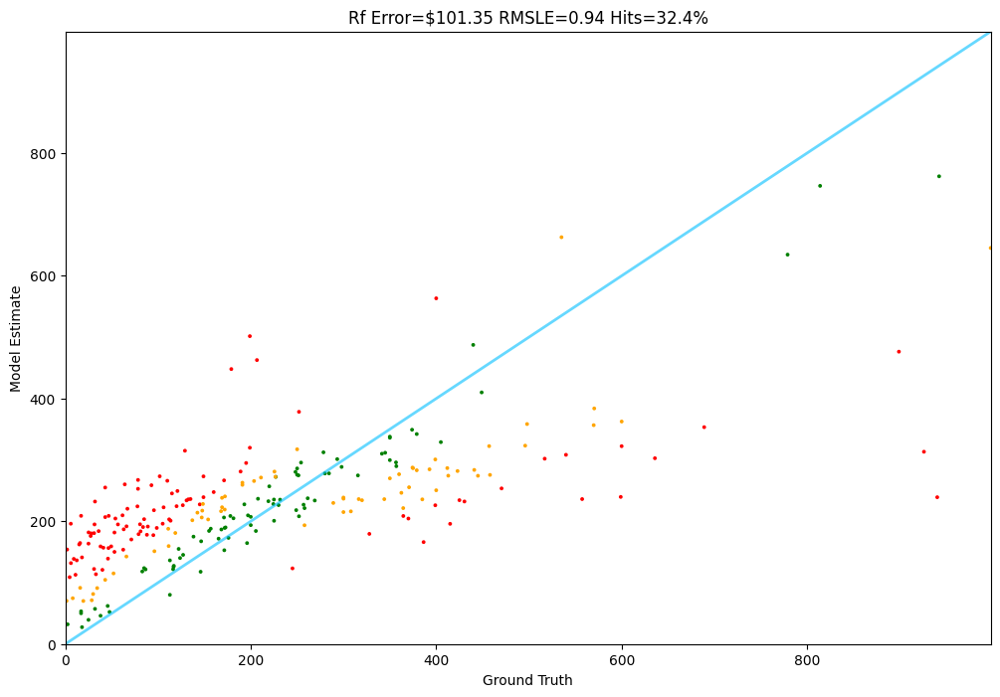

In [75]:
Tester.test(rf, test)

In [76]:
product = "Quadcast HyperX condenser mic for high quality audio for podcasting"

In [77]:
print(specialist.price(product))
print(frontier.price(product))
print(random_forest.price(product))

INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


189.0


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $154.59
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


154.59


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $295.16


295.16450000000026


In [78]:
specialists = []
frontiers = []
random_forests = []
prices = []
for item in tqdm(test[1000:1250]):                                                              # Select 250 test data points (randombly between item 1000 and 1250) - then look for price of item from 3 models
    text = description(item)
    specialists.append(specialist.price(text))
    frontiers.append(frontier.price(text))
    random_forests.append(random_forest.price(text))
    prices.append(item.price)

  0%|          | 0/250 [00:00<?, ?it/s]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $40.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $103.83
  0%|          | 1/250 [00:07<31:32,  7.60s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $261.04
  1%|          | 2/250 [00:16<34:52,  8.44s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $348.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $348.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $297.90
  1%|          | 3/250 [00:25<35:30,  8.63s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $288.94
  2%|▏         | 4/250 [00:32<32:17,  7.88s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $336.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $175.02
  2%|▏         | 5/250 [00:39<30:35,  7.49s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $24.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $210.87
  2%|▏         | 6/250 [00:45<29:18,  7.21s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $92.88
  3%|▎         | 7/250 [00:52<28:58,  7.15s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $59.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $93.01
  3%|▎         | 8/250 [00:59<28:39,  7.11s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $296.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $250.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $185.79
  4%|▎         | 9/250 [01:06<28:03,  6.98s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $300.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $499.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $332.42
  4%|▍         | 10/250 [01:12<26:18,  6.58s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $266.17
  4%|▍         | 11/250 [01:18<25:25,  6.38s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $489.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $393.97
  5%|▍         | 12/250 [01:23<24:41,  6.22s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $285.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $324.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $270.92
  5%|▌         | 13/250 [01:29<24:25,  6.18s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $546.13
  6%|▌         | 14/250 [01:36<24:13,  6.16s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $125.11
  6%|▌         | 15/250 [01:42<23:50,  6.09s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $59.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $228.18
  6%|▋         | 16/250 [01:47<23:19,  5.98s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $163.56
  7%|▋         | 17/250 [01:53<23:08,  5.96s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $204.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $204.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $222.69
  7%|▋         | 18/250 [02:00<24:21,  6.30s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $135.49
  8%|▊         | 19/250 [02:07<24:23,  6.34s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $517.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $470.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.83
  8%|▊         | 20/250 [02:15<26:55,  7.02s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $283.25
  8%|▊         | 21/250 [02:21<25:12,  6.61s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $194.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $204.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $215.88
  9%|▉         | 22/250 [02:27<24:39,  6.49s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $95.65
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $119.50
  9%|▉         | 23/250 [02:33<23:52,  6.31s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $115.39
 10%|▉         | 24/250 [02:39<23:17,  6.19s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $147.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $215.98
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $189.71
 10%|█         | 25/250 [02:46<24:32,  6.55s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $157.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $212.96
 10%|█         | 26/250 [02:55<27:17,  7.31s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $998.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $899.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $514.97
 11%|█         | 27/250 [03:01<25:33,  6.88s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $125.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $203.13
 11%|█         | 28/250 [03:08<25:45,  6.96s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $303.71
 12%|█▏        | 29/250 [03:15<25:17,  6.87s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $259.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.53
 12%|█▏        | 30/250 [03:21<23:41,  6.46s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $279.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $259.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $250.55
 12%|█▏        | 31/250 [03:27<23:01,  6.31s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $310.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $256.50
 13%|█▎        | 32/250 [03:32<22:28,  6.19s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $79.25
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $99.30
 13%|█▎        | 33/250 [03:38<21:35,  5.97s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $145.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $164.70
 14%|█▎        | 34/250 [03:44<21:12,  5.89s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $145.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $217.81
 14%|█▍        | 35/250 [03:51<22:13,  6.20s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $549.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $549.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.76
 14%|█▍        | 36/250 [03:56<21:46,  6.11s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $195.29
 15%|█▍        | 37/250 [04:02<21:06,  5.95s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $200.85
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $184.25
 15%|█▌        | 38/250 [04:08<21:17,  6.03s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $198.29
 16%|█▌        | 39/250 [04:14<21:07,  6.01s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $251.27
 16%|█▌        | 40/250 [04:20<20:20,  5.81s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $59.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $59.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $190.17
 16%|█▋        | 41/250 [04:25<20:05,  5.77s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $253.96
 17%|█▋        | 42/250 [04:31<20:04,  5.79s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $265.27
 17%|█▋        | 43/250 [04:37<20:35,  5.97s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $42.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $192.51
 18%|█▊        | 44/250 [04:44<21:36,  6.29s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $237.90
 18%|█▊        | 45/250 [04:51<21:45,  6.37s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $89.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $214.30
 18%|█▊        | 46/250 [04:57<20:52,  6.14s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $330.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $199.28
 19%|█▉        | 47/250 [05:03<20:50,  6.16s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $45.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $142.18
 19%|█▉        | 48/250 [05:09<20:38,  6.13s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $306.56
 20%|█▉        | 49/250 [05:16<21:24,  6.39s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $135.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $310.01
 20%|██        | 50/250 [05:23<22:21,  6.71s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $82.32
 20%|██        | 51/250 [05:29<21:26,  6.46s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $222.80
 21%|██        | 52/250 [05:35<20:35,  6.24s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $202.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $350.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $291.22
 21%|██        | 53/250 [05:41<20:18,  6.19s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $150.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $275.60
 22%|██▏       | 54/250 [05:48<20:40,  6.33s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $316.07
 22%|██▏       | 55/250 [05:54<20:23,  6.28s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $39.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $71.02
 22%|██▏       | 56/250 [06:01<21:12,  6.56s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $351.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $340.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $272.84
 23%|██▎       | 57/250 [06:08<21:28,  6.68s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $255.53
 23%|██▎       | 58/250 [06:14<21:10,  6.61s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $196.32
 24%|██▎       | 59/250 [06:22<21:29,  6.75s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $277.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $373.28
 24%|██▍       | 60/250 [06:28<21:27,  6.78s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $16.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $94.82
 24%|██▍       | 61/250 [06:35<21:13,  6.74s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $680.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $699.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $584.71
 25%|██▍       | 62/250 [06:41<20:41,  6.61s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $180.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $254.12
 25%|██▌       | 63/250 [06:49<21:40,  6.96s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $251.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $250.60
 26%|██▌       | 64/250 [06:56<21:16,  6.86s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $192.79
 26%|██▌       | 65/250 [07:02<20:19,  6.59s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $119.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $217.77
 26%|██▋       | 66/250 [07:08<19:38,  6.40s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $28.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $123.55
 27%|██▋       | 67/250 [07:16<21:06,  6.92s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $59.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $120.33
 27%|██▋       | 68/250 [07:22<20:10,  6.65s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $260.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $245.52
 28%|██▊       | 69/250 [07:28<19:58,  6.62s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $240.15
 28%|██▊       | 70/250 [07:34<19:17,  6.43s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $147.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $95.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $203.20
 28%|██▊       | 71/250 [07:40<18:54,  6.34s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $41.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $183.73
 29%|██▉       | 72/250 [07:46<18:23,  6.20s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $499.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $240.60
 29%|██▉       | 73/250 [07:53<18:22,  6.23s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $282.59
 30%|██▉       | 74/250 [07:59<18:02,  6.15s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $248.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $327.56
 30%|███       | 75/250 [08:07<20:10,  6.91s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $162.07
 30%|███       | 76/250 [08:13<19:21,  6.68s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $699.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.75
 31%|███       | 77/250 [08:19<18:34,  6.44s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $229.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $260.18
 31%|███       | 78/250 [08:25<17:53,  6.24s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $375.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $436.27
 32%|███▏      | 79/250 [08:32<17:59,  6.32s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $270.42
 32%|███▏      | 80/250 [08:37<17:23,  6.14s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $184.00
 32%|███▏      | 81/250 [08:44<17:54,  6.36s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $187.85
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $209.17
 33%|███▎      | 82/250 [08:50<17:07,  6.12s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $530.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $292.46
 33%|███▎      | 83/250 [08:55<16:20,  5.87s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $202.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $216.78
 34%|███▎      | 84/250 [09:01<16:35,  6.00s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $243.02
 34%|███▍      | 85/250 [09:07<16:19,  5.94s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $300.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $295.64
 34%|███▍      | 86/250 [09:13<16:05,  5.88s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $24.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $210.11
 35%|███▍      | 87/250 [09:20<16:35,  6.11s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $277.91
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $307.63
 35%|███▌      | 88/250 [09:25<16:18,  6.04s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $250.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $243.28
 36%|███▌      | 89/250 [09:31<16:02,  5.98s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $93.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $229.70
 36%|███▌      | 90/250 [09:37<15:50,  5.94s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $206.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $206.34
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $190.47
 36%|███▋      | 91/250 [09:43<15:48,  5.97s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.66
 37%|███▋      | 92/250 [09:50<16:18,  6.19s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $142.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $169.57
 37%|███▋      | 93/250 [09:57<16:46,  6.41s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $198.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $224.96
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $202.18
 38%|███▊      | 94/250 [10:03<16:10,  6.22s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $180.60
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $179.18
 38%|███▊      | 95/250 [10:08<15:38,  6.05s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $246.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $225.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.65
 38%|███▊      | 96/250 [10:15<15:52,  6.18s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $59.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $144.69
 39%|███▉      | 97/250 [10:21<15:36,  6.12s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $7.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $174.94
 39%|███▉      | 98/250 [10:27<15:44,  6.21s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $99.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $148.85
 40%|███▉      | 99/250 [10:34<16:03,  6.38s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $679.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $746.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $626.81
 40%|████      | 100/250 [10:40<15:35,  6.23s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $201.24
 40%|████      | 101/250 [10:47<15:52,  6.39s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $400.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $429.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.60
 41%|████      | 102/250 [10:52<15:18,  6.20s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $655.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $536.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $308.03
 41%|████      | 103/250 [10:58<14:53,  6.08s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $134.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $271.90
 42%|████▏     | 104/250 [11:04<14:49,  6.09s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $211.01
 42%|████▏     | 105/250 [11:11<15:10,  6.28s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $114.24
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $82.48
 42%|████▏     | 106/250 [11:17<15:14,  6.35s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $6.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $8.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $178.81
 43%|████▎     | 107/250 [11:25<15:48,  6.63s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $836.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $525.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $309.47
 43%|████▎     | 108/250 [11:32<15:59,  6.75s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $365.82
 44%|████▎     | 109/250 [11:38<15:25,  6.57s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $14.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $172.14
 44%|████▍     | 110/250 [11:44<14:53,  6.38s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $261.24
 44%|████▍     | 111/250 [11:49<14:15,  6.16s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $129.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $223.05
 45%|████▍     | 112/250 [11:56<14:37,  6.36s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $36.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $88.61
 45%|████▌     | 113/250 [12:03<14:29,  6.35s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $188.40
 46%|████▌     | 114/250 [12:08<13:56,  6.15s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $195.46
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $198.21
 46%|████▌     | 115/250 [12:14<13:31,  6.01s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $220.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $231.87
 46%|████▋     | 116/250 [12:20<13:40,  6.12s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $170.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $209.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $259.42
 47%|████▋     | 117/250 [12:27<13:36,  6.14s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $157.00
 47%|████▋     | 118/250 [12:32<13:20,  6.06s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $179.36
 48%|████▊     | 119/250 [12:39<13:19,  6.10s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $418.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $369.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $246.75
 48%|████▊     | 120/250 [12:46<13:48,  6.37s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $223.98
 48%|████▊     | 121/250 [12:51<13:19,  6.20s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $301.50
 49%|████▉     | 122/250 [12:57<12:57,  6.08s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $340.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $224.51
 49%|████▉     | 123/250 [13:04<13:09,  6.22s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $247.75
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $206.53
 50%|████▉     | 124/250 [13:10<13:02,  6.21s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $52.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $104.61
 50%|█████     | 125/250 [13:16<12:50,  6.17s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $279.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $230.80
 50%|█████     | 126/250 [13:22<12:23,  6.00s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $599.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $290.86
 51%|█████     | 127/250 [13:28<12:38,  6.17s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $202.21
 51%|█████     | 128/250 [13:34<12:34,  6.19s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $200.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $242.07
 52%|█████▏    | 129/250 [13:40<12:13,  6.06s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $84.02
 52%|█████▏    | 130/250 [13:47<12:27,  6.23s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $169.93
 52%|█████▏    | 131/250 [13:53<12:17,  6.20s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $799.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $331.09
 53%|█████▎    | 132/250 [13:59<12:09,  6.18s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $137.68
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $125.11
 53%|█████▎    | 133/250 [14:05<11:51,  6.08s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $129.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $381.70
 54%|█████▎    | 134/250 [14:12<12:30,  6.47s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $97.47
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $161.84
 54%|█████▍    | 135/250 [14:19<12:27,  6.50s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $495.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $280.00
 54%|█████▍    | 136/250 [14:25<12:18,  6.48s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $249.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.35
 55%|█████▍    | 137/250 [14:32<12:22,  6.57s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $134.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $170.86
 55%|█████▌    | 138/250 [14:40<12:45,  6.84s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $89.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $129.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $307.80
 56%|█████▌    | 139/250 [14:46<12:38,  6.83s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $412.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $459.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $245.22
 56%|█████▌    | 140/250 [14:53<12:25,  6.77s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $274.45
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $243.56
 56%|█████▋    | 141/250 [15:00<12:21,  6.81s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $799.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $799.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $263.37
 57%|█████▋    | 142/250 [15:06<12:06,  6.73s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $221.48
 57%|█████▋    | 143/250 [15:13<12:02,  6.75s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $72.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $78.49
 58%|█████▊    | 144/250 [15:19<11:37,  6.58s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $85.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $247.19
 58%|█████▊    | 145/250 [15:25<11:10,  6.39s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $93.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $45.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $162.67
 58%|█████▊    | 146/250 [15:31<10:52,  6.27s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $59.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $29.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $71.60
 59%|█████▉    | 147/250 [15:37<10:28,  6.10s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $105.80
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $174.01
 59%|█████▉    | 148/250 [15:43<10:19,  6.07s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $63.21
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.83
 60%|█████▉    | 149/250 [15:49<10:16,  6.10s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $182.79
 60%|██████    | 150/250 [15:55<10:05,  6.05s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $318.39
 60%|██████    | 151/250 [16:01<10:01,  6.08s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $650.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $649.83
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $261.49
 61%|██████    | 152/250 [16:07<09:50,  6.02s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $123.51
 61%|██████    | 153/250 [16:13<09:49,  6.07s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $132.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $203.68
 62%|██████▏   | 154/250 [16:20<09:47,  6.12s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $134.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $195.07
 62%|██████▏   | 155/250 [16:26<09:46,  6.17s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $174.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $178.54
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $198.91
 62%|██████▏   | 156/250 [16:33<10:18,  6.58s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $129.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $188.62
 63%|██████▎   | 157/250 [16:40<10:05,  6.51s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $700.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $499.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $273.97
 63%|██████▎   | 158/250 [16:47<10:16,  6.70s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $263.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $293.55
 64%|██████▎   | 159/250 [16:54<10:07,  6.68s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $63.22
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $196.41
 64%|██████▍   | 160/250 [17:01<10:21,  6.91s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $86.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $122.40
 64%|██████▍   | 161/250 [17:10<11:10,  7.53s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $170.55
 65%|██████▍   | 162/250 [17:17<10:42,  7.30s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $100.13
 65%|██████▌   | 163/250 [17:23<10:05,  6.96s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $680.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $450.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $305.14
 66%|██████▌   | 164/250 [17:29<09:41,  6.77s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $279.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $209.00
 66%|██████▌   | 165/250 [17:35<09:10,  6.48s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $175.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $215.39
 66%|██████▋   | 166/250 [17:41<09:01,  6.45s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $188.49
 67%|██████▋   | 167/250 [17:49<09:17,  6.72s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $237.31
 67%|██████▋   | 168/250 [17:56<09:11,  6.73s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $216.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $189.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $161.99
 68%|██████▊   | 169/250 [18:02<09:00,  6.67s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $330.28
 68%|██████▊   | 170/250 [18:09<08:50,  6.63s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $445.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $263.50
 68%|██████▊   | 171/250 [18:16<08:52,  6.74s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $127.30
 69%|██████▉   | 172/250 [18:23<08:49,  6.79s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $119.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $213.95
 69%|██████▉   | 173/250 [18:30<08:49,  6.87s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $112.35
 70%|██████▉   | 174/250 [18:36<08:24,  6.64s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $249.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $249.03
 70%|███████   | 175/250 [18:42<08:06,  6.49s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $419.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $265.11
 70%|███████   | 176/250 [18:48<07:44,  6.28s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $507.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $561.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $415.17
 71%|███████   | 177/250 [18:53<07:25,  6.10s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $200.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $212.05
 71%|███████   | 178/250 [18:59<07:16,  6.07s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $145.22
 72%|███████▏  | 179/250 [19:05<07:08,  6.03s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $189.10
 72%|███████▏  | 180/250 [19:11<07:04,  6.06s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $220.91
 72%|███████▏  | 181/250 [19:18<07:04,  6.16s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $277.28
 73%|███████▎  | 182/250 [19:24<07:02,  6.21s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $270.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $242.75
 73%|███████▎  | 183/250 [19:30<06:49,  6.12s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $225.88
 74%|███████▎  | 184/250 [19:36<06:38,  6.04s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $369.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $303.89
 74%|███████▍  | 185/250 [19:42<06:38,  6.13s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $85.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $212.97
 74%|███████▍  | 186/250 [19:48<06:30,  6.10s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $142.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $136.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $129.11
 75%|███████▍  | 187/250 [19:54<06:19,  6.03s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $193.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $300.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $353.90
 75%|███████▌  | 188/250 [20:01<06:23,  6.19s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $130.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $205.99
 76%|███████▌  | 189/250 [20:07<06:13,  6.13s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $147.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $135.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $216.95
 76%|███████▌  | 190/250 [20:12<05:55,  5.92s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $379.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $531.04
 76%|███████▋  | 191/250 [20:19<06:06,  6.21s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $142.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $350.41
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $268.50
 77%|███████▋  | 192/250 [20:26<06:13,  6.44s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $146.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $312.73
 77%|███████▋  | 193/250 [20:33<06:19,  6.66s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $59.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $196.66
 78%|███████▊  | 194/250 [20:39<06:01,  6.45s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $210.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $212.00
 78%|███████▊  | 195/250 [20:45<05:47,  6.32s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $138.99
 78%|███████▊  | 196/250 [20:51<05:36,  6.23s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $250.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $278.79
 79%|███████▉  | 197/250 [20:57<05:22,  6.09s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $39.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $145.83
 79%|███████▉  | 198/250 [21:02<05:06,  5.89s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $376.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $385.81
 80%|███████▉  | 199/250 [21:08<05:02,  5.93s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $275.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $225.05
 80%|████████  | 200/250 [21:14<04:57,  5.94s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $349.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $390.70
 80%|████████  | 201/250 [21:20<04:52,  5.97s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $421.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $450.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $267.43
 81%|████████  | 202/250 [21:27<04:54,  6.13s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $204.59
 81%|████████  | 203/250 [21:33<04:47,  6.11s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $175.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $232.59
 82%|████████▏ | 204/250 [21:39<04:39,  6.07s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $327.76
 82%|████████▏ | 205/250 [21:48<05:10,  6.90s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $17.59
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $197.78
 82%|████████▏ | 206/250 [21:57<05:33,  7.58s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $69.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $245.13
 83%|████████▎ | 207/250 [22:03<05:10,  7.22s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $412.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $443.25
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $281.85
 83%|████████▎ | 208/250 [22:09<04:45,  6.79s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $180.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $278.11
 84%|████████▎ | 209/250 [22:15<04:29,  6.58s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $142.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $182.80
 84%|████████▍ | 210/250 [22:22<04:25,  6.64s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $125.39
 84%|████████▍ | 211/250 [22:28<04:12,  6.47s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $805.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $850.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $245.39
 85%|████████▍ | 212/250 [22:34<04:04,  6.44s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $99.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $255.12
 85%|████████▌ | 213/250 [22:40<03:54,  6.33s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $229.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $303.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.90
 86%|████████▌ | 214/250 [22:48<03:57,  6.60s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $124.85
 86%|████████▌ | 215/250 [22:56<04:12,  7.23s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $284.78
 86%|████████▋ | 216/250 [23:03<04:01,  7.09s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $139.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $139.89
 87%|████████▋ | 217/250 [23:09<03:43,  6.77s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $355.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $450.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $421.06
 87%|████████▋ | 218/250 [23:15<03:26,  6.46s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $42.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $115.34
 88%|████████▊ | 219/250 [23:21<03:21,  6.48s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $116.94
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $197.89
 88%|████████▊ | 220/250 [23:28<03:11,  6.38s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $176.01
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $226.32
 88%|████████▊ | 221/250 [23:34<03:01,  6.26s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $74.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $213.13
 89%|████████▉ | 222/250 [23:39<02:51,  6.14s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $166.49
 89%|████████▉ | 223/250 [23:46<02:49,  6.26s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $240.70
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $253.97
 90%|████████▉ | 224/250 [23:53<02:45,  6.36s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $142.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $166.23
 90%|█████████ | 225/250 [24:00<02:47,  6.68s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $159.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $382.19
 90%|█████████ | 226/250 [24:07<02:40,  6.69s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $409.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $216.17
 91%|█████████ | 227/250 [24:13<02:31,  6.59s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $112.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $125.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $201.41
 91%|█████████ | 228/250 [24:20<02:25,  6.63s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $19.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $65.04
 92%|█████████▏| 229/250 [24:27<02:22,  6.78s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $69.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $69.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $212.35
 92%|█████████▏| 230/250 [24:34<02:19,  6.96s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $672.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $624.98
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $383.34
 92%|█████████▏| 231/250 [24:41<02:08,  6.75s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $94.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $231.37
 93%|█████████▎| 232/250 [24:48<02:06,  7.00s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $154.53
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $190.55
 93%|█████████▎| 233/250 [24:54<01:55,  6.81s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $186.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $180.53
 94%|█████████▎| 234/250 [25:01<01:48,  6.78s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $156.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $134.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $354.76
 94%|█████████▍| 235/250 [25:09<01:45,  7.02s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $289.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $255.52
 94%|█████████▍| 236/250 [25:15<01:35,  6.82s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $139.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $175.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $261.80
 95%|█████████▍| 237/250 [25:21<01:24,  6.49s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $18.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $159.31
 95%|█████████▌| 238/250 [25:28<01:19,  6.64s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $167.57
 96%|█████████▌| 239/250 [25:34<01:11,  6.51s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $264.44
 96%|█████████▌| 240/250 [25:40<01:02,  6.29s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $250.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $258.20
 96%|█████████▋| 241/250 [25:46<00:55,  6.15s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $339.22
 97%|█████████▋| 242/250 [25:53<00:51,  6.40s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $150.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $195.88
 97%|█████████▋| 243/250 [25:58<00:43,  6.17s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $24.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $134.40
 98%|█████████▊| 244/250 [26:04<00:36,  6.06s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $141.72
 98%|█████████▊| 245/250 [26:11<00:31,  6.28s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $51.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $38.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $69.47
 98%|█████████▊| 246/250 [26:17<00:24,  6.13s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $221.67
 99%|█████████▉| 247/250 [26:23<00:18,  6.07s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $300.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $242.99
 99%|█████████▉| 248/250 [26:29<00:12,  6.09s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $180.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $175.17
100%|█████████▉| 249/250 [26:37<00:06,  6.65s/it]INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $150.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $198.31
100%|██████████| 250/250 [26:43<00:00,  6.41s/it]


In [79]:
mins = [min(s,f,r) for s,f,r in zip(specialists, frontiers, random_forests)]                   # Create a list for lowest estimate from any model for a given product
maxes = [max(s,f,r) for s,f,r in zip(specialists, frontiers, random_forests)]                  # Create a list for highest estimate from any model for a given product

X = pd.DataFrame({
    'Specialist': specialists,
    'Frontier': frontiers,
    'RandomForest': random_forests,
    'Min': mins,
    'Max': maxes,
})

# Convert y to a Series
y = pd.Series(prices)

In [80]:
# Train a Linear Regression - to see what weighted avg gives best results. This will result in all coefficients
np.random.seed(42)

lr = LinearRegression()
lr.fit(X, y)

feature_columns = X.columns.tolist()

for feature, coef in zip(feature_columns, lr.coef_):
    print(f"{feature}: {coef:.2f}")
print(f"Intercept={lr.intercept_:.2f}")

Specialist: 0.69
Frontier: 0.25
RandomForest: -0.02
Min: -0.27
Max: 0.26
Intercept=4.78


In [81]:
# Save it to ensemble model pickle file

joblib.dump(lr, 'ensemble_model.pkl')

['ensemble_model.pkl']

In [82]:
from agents.ensemble_agent import EnsembleAgent
ensemble = EnsembleAgent(collection)

INFO:root:[Ensemble Agent] Initializing Ensemble Agent
INFO:root:[Specialist Agent] Specialist Agent is initializing - connecting to modal
INFO:root:[Specialist Agent] Specialist Agent is ready
INFO:root:[Frontier Agent] Initializing Frontier Agent
INFO:root:[Frontier Agent] Frontier Agent is set up with DeepSeek
INFO:sentence_transformers.SentenceTransformer:Use pytorch device_name: cuda:0
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/all-MiniLM-L6-v2
INFO:root:[Frontier Agent] Frontier Agent is ready
INFO:root:[Random Forest Agent] Random Forest Agent is initializing
INFO:sentence_transformers.SentenceTransformer:Use pytorch device_name: cuda:0
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/all-MiniLM-L6-v2
INFO:root:[Random Forest Agent] Random Forest Agent is ready
INFO:root:[Ensemble Agent] Ensemble Agent is ready


In [83]:
ensemble.price(product)

INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $154.59
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $295.16
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $204.91


np.float64(204.90644762094806)

In [84]:
def ensemble_pricer(item):
    return max(0,ensemble.price(description(item)))

INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model
INFO:root:[Specialist Agent] Specialist Agent completed - predicting $412.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $323.41
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $287.56
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $395.63
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


1: Guess: $395.63 Truth: $374.41 Error: $21.22 SLE: 0.00 Item: OEM AC Compressor w/A/C Repair Kit For F...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $215.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $200.81
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $188.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


2: Guess: $188.34 Truth: $225.11 Error: $36.77 SLE: 0.03 Item: Motorcraft YB3125 Fan Clutch


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $209.71
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $77.94
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


3: Guess: $77.94 Truth: $61.68 Error: $16.26 SLE: 0.05 Item: Dorman 603-159 Front Washer Fluid Reserv...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $499.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $362.57
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $402.73
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


4: Guess: $402.73 Truth: $599.99 Error: $197.26 SLE: 0.16 Item: HP Premium 17.3-inch HD Plus Touchscreen...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.87
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $69.27
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


5: Guess: $69.27 Truth: $16.99 Error: $52.28 SLE: 1.86 Item: 5-Position Super Switch Pickup Selector ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $57.31
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $32.00
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


6: Guess: $32.00 Truth: $31.99 Error: $0.01 SLE: 0.00 Item: Horror Bookmarks, Resin Horror Bookmarks...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $68.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $273.30
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $162.51
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


7: Guess: $162.51 Truth: $101.79 Error: $60.72 SLE: 0.22 Item: SK6241 - Stinger 4 Gauge 6000 Series Pow...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $229.88
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $350.10
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


8: Guess: $350.10 Truth: $289.00 Error: $61.10 SLE: 0.04 Item: Godox ML60Bi LED Light Kit, Handheld LED...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $950.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $302.75
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $902.20
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


9: Guess: $902.20 Truth: $635.86 Error: $266.34 SLE: 0.12 Item: Randall RG75DG3PLUS G3 Plus 100-Watt Com...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $59.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $191.76
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $89.88
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


10: Guess: $89.88 Truth: $65.99 Error: $23.89 SLE: 0.09 Item: HOLDWILL 6 Pack LED Shop Light, 4FT 24W ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $348.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $295.68
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $258.78
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


11: Guess: $258.78 Truth: $254.21 Error: $4.57 SLE: 0.00 Item: Viking Horns V103C/1005ATK 3 Gallon Air ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $412.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $448.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.30
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $440.76
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


12: Guess: $440.76 Truth: $412.99 Error: $27.77 SLE: 0.00 Item: CURT 70110 Custom Tow Bar Base Plate Bra...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $236.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $215.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $184.18
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $230.74
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


13: Guess: $230.74 Truth: $205.50 Error: $25.24 SLE: 0.01 Item: 10-Pack Solar HAMMERED BRONZE Finish Pos...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $269.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $280.46
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $261.77
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


14: Guess: $261.77 Truth: $248.23 Error: $13.54 SLE: 0.00 Item: COSTWAY Electric Tumble Dryer, Sliver


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $300.78
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $330.40
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


15: Guess: $330.40 Truth: $399.00 Error: $68.60 SLE: 0.04 Item: FREE SIGNAL TV Transit 32" 12 Volt DC Po...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $372.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $359.44
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $349.20
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $349.17
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


16: Guess: $349.17 Truth: $373.94 Error: $24.77 SLE: 0.00 Item: Bilstein 5100 Monotube Gas Shock Set com...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $258.73
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $160.08
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


17: Guess: $160.08 Truth: $92.89 Error: $67.19 SLE: 0.29 Item: Sangean K-200 Multi-Function Upright AM/...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $39.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $115.09
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $88.17
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


18: Guess: $88.17 Truth: $51.99 Error: $36.18 SLE: 0.27 Item: Charles Leonard Magnetic Lapboard Class ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $448.04
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $316.61
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


19: Guess: $316.61 Truth: $179.00 Error: $137.61 SLE: 0.32 Item: Gigabyte AMD Radeon HD 7870 2 GB GDDR5 D...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $19.42
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $70.14
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $34.96
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


20: Guess: $34.96 Truth: $19.42 Error: $15.54 SLE: 0.32 Item: 3dRose LLC 8 x 8 x 0.25 Inches Bull Terr...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $479.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $308.31
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $454.79
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


21: Guess: $454.79 Truth: $539.95 Error: $85.16 SLE: 0.03 Item: ROKINON 85mm F1.4 Auto Focus Full Frame ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $154.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $217.38
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $153.13
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


22: Guess: $153.13 Truth: $147.67 Error: $5.46 SLE: 0.00 Item: AUTOSAVER88 Headlight Assembly Compatibl...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $163.62
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $58.30
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


23: Guess: $58.30 Truth: $24.99 Error: $33.31 SLE: 0.68 Item: ASI NAUTICAL 2.5 Inches Opera Glasses Bi...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $89.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $273.17
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $132.60
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


24: Guess: $132.60 Truth: $149.00 Error: $16.40 SLE: 0.01 Item: Behringer TUBE OVERDRIVE TO100 Authentic...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $50.11
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $27.25
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


25: Guess: $27.25 Truth: $16.99 Error: $10.26 SLE: 0.20 Item: Fun Express Insect Finger Puppets - 24 f...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $7.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $74.64
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $29.44
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


26: Guess: $29.44 Truth: $7.99 Error: $21.45 SLE: 1.49 Item: WAFJAMF Roller Stamp Identity Theft Stam...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $187.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $197.47
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $193.73
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $181.51
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


27: Guess: $181.51 Truth: $199.99 Error: $18.48 SLE: 0.01 Item: Capulina Tiffany Floor Lamp 2-Light 16" ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $270.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.82
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $279.79
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


28: Guess: $279.79 Truth: $251.45 Error: $28.34 SLE: 0.01 Item: Apple Watch Series 6 (GPS, 44mm) - Space...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $237.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $247.26
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.22
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $227.86
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


29: Guess: $227.86 Truth: $231.62 Error: $3.76 SLE: 0.00 Item: ICON 01725 Tandem Axle Fender Skirt FS17...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $250.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.23
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $163.63
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


30: Guess: $163.63 Truth: $135.00 Error: $28.63 SLE: 0.04 Item: SanDisk 128GB Ultra (10 Pack) MicroSD Cl...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $403.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $388.13
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $295.94
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $401.00
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


31: Guess: $401.00 Truth: $356.62 Error: $44.38 SLE: 0.01 Item: Velvac 2020,L,C/Hr,W,E2003,102",Bk - 715...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $221.39
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $267.18
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


32: Guess: $267.18 Truth: $257.99 Error: $9.19 SLE: 0.00 Item: TCMT Passenger Backrest Sissy Bar & Lugg...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $45.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $180.30
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $73.91
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


33: Guess: $73.91 Truth: $27.99 Error: $45.92 SLE: 0.90 Item: Alnicov 63.5MM Brass Tremolo Block，Tremo...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $175.91
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $266.65
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $148.87
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


34: Guess: $148.87 Truth: $171.20 Error: $22.33 SLE: 0.02 Item: Subaru Forester Outback Legacy OEM Engin...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $495.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $225.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.43
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $467.32
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


35: Guess: $467.32 Truth: $225.00 Error: $242.32 SLE: 0.53 Item: Richmond Auto Upholstery - 2012 Dodge Ra...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $196.05
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $180.46
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


36: Guess: $180.46 Truth: $105.00 Error: $75.46 SLE: 0.29 Item: AP-39 Automotive Paint Primer Grey 2K Ur...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $300.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.80
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $297.82
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


37: Guess: $297.82 Truth: $299.99 Error: $2.17 SLE: 0.00 Item: Road Top Wireless Carplay Retrofit Kit D...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $655.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $710.11
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $662.85
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $633.57
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


38: Guess: $633.57 Truth: $535.09 Error: $98.48 SLE: 0.03 Item: Gibson Performance Exhaust 5658 Aluminiz...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $136.40
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $51.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


39: Guess: $51.34 Truth: $12.33 Error: $39.01 SLE: 1.87 Item: Bella Tunno Happy Links - Baby Montessor...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $203.42
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $130.61
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


40: Guess: $130.61 Truth: $84.99 Error: $45.62 SLE: 0.18 Item: CANMORE H300 Handheld GPS Golf Device, S...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $16.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $91.55
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $38.19
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


41: Guess: $38.19 Truth: $15.99 Error: $22.20 SLE: 0.70 Item: DCPOWER AC Adapter Compatible Replacemen...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $153.72
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $79.87
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


42: Guess: $79.87 Truth: $62.44 Error: $17.43 SLE: 0.06 Item: Sharp, VX2128V, Commercial Desktop Calcu...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $97.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $118.23
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $92.53
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


43: Guess: $92.53 Truth: $82.99 Error: $9.54 SLE: 0.01 Item: Melissa & Doug Lifelike Plush Stork Gian...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $322.38
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $289.77
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


44: Guess: $289.77 Truth: $599.95 Error: $310.18 SLE: 0.53 Item: Sony SSCS8 2-Way 3-Driver Center Channel...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $229.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $294.95
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $227.54
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


45: Guess: $227.54 Truth: $194.99 Error: $32.55 SLE: 0.02 Item: ASUS Chromebook CX1, 14" Full HD NanoEdg...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $344.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $311.66
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $302.38
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


46: Guess: $302.38 Truth: $344.95 Error: $42.57 SLE: 0.02 Item: FiiO X7 32GB Hi-Res Lossless Music Playe...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $38.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $42.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $46.08
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $42.87
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


47: Guess: $42.87 Truth: $37.99 Error: $4.88 SLE: 0.01 Item: TORRO Leather Case Compatible with iPhon...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $215.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $225.33
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $228.14
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $207.75
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


48: Guess: $207.75 Truth: $224.35 Error: $16.60 SLE: 0.01 Item: Universal Air Conditioner KT 1031 A/C Co...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $836.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $750.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $746.56
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $775.05
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


49: Guess: $775.05 Truth: $814.00 Error: $38.95 SLE: 0.00 Item: Street Series Stainless Performance Cat-...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $487.41
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $361.38
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


50: Guess: $361.38 Truth: $439.88 Error: $78.50 SLE: 0.04 Item: Lenovo IdeaPad 3 14-inch Laptop, 14.0-in...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $349.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $317.58
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $310.11
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $327.91
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


51: Guess: $327.91 Truth: $341.43 Error: $13.52 SLE: 0.00 Item: Access Bed Covers TonnoSport 22050219 - ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.81
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $92.65
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


52: Guess: $92.65 Truth: $46.78 Error: $45.87 SLE: 0.45 Item: G.I. JOE Hasbro 3 3/4" Wave 5 Action Fig...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $152.83
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $193.24
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


53: Guess: $193.24 Truth: $171.44 Error: $21.80 SLE: 0.01 Item: T&S Brass B-0232-BST Double Pantry Fauce...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $275.54
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $475.26
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


54: Guess: $475.26 Truth: $458.00 Error: $17.26 SLE: 0.00 Item: ZTUOAUMA Fuel Injection Pump 3090942 309...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $234.06
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $155.99
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


55: Guess: $155.99 Truth: $130.75 Error: $25.24 SLE: 0.03 Item: 2AP18AA#ABA Hp Prime Graphing Calculator...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $45.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $190.63
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $88.24
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


56: Guess: $88.24 Truth: $83.81 Error: $4.43 SLE: 0.00 Item: Lowrance 000-0119-83 Nmea 2000 25' Exten...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $166.11
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $174.98
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


57: Guess: $174.98 Truth: $386.39 Error: $211.41 SLE: 0.62 Item: Jeep Genuine Accessories 82213051 Hood L...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $139.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $222.86
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $188.06
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


58: Guess: $188.06 Truth: $169.00 Error: $19.06 SLE: 0.01 Item: GODOX CB-06 Hard Carrying Case with Whee...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $16.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $15.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $141.16
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $50.41
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


59: Guess: $50.41 Truth: $17.95 Error: $32.46 SLE: 1.00 Item: Au-Tomotive Gold, INC. Ford Black Valet ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $235.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $233.86
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $281.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


60: Guess: $281.34 Truth: $269.00 Error: $12.34 SLE: 0.00 Item: Snailfly Black Roof Rack Rail + Cross Ba...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $224.29
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $134.92
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


61: Guess: $134.92 Truth: $77.77 Error: $57.15 SLE: 0.30 Item: KING SHA Anti Glare LED Track Lighting H...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $77.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $191.43
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $106.41
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


62: Guess: $106.41 Truth: $88.99 Error: $17.42 SLE: 0.03 Item: APS Compatible with Chevy Silverado 1500...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $296.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $362.69
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $221.45
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $331.74
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


63: Guess: $331.74 Truth: $364.41 Error: $32.67 SLE: 0.01 Item: Wilwood Engineering 14011291R Brake Cali...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $134.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $145.78
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $145.27
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $133.52
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


64: Guess: $133.52 Truth: $127.03 Error: $6.49 SLE: 0.00 Item: ACDelco Gold 336-1925A Starter, Remanufa...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $655.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $778.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $634.48
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $675.00
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


65: Guess: $675.00 Truth: $778.95 Error: $103.95 SLE: 0.02 Item: UWS EC10783 69-Inch Matte Black Heavy-Wa...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $179.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $462.69
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $254.16
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


66: Guess: $254.16 Truth: $206.66 Error: $47.50 SLE: 0.04 Item: Dell Latitude E5440 14in Business Laptop...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $183.95
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $79.58
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


67: Guess: $79.58 Truth: $35.94 Error: $43.64 SLE: 0.61 Item: (Plug and Play) Spare Tire Brake Light W...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $129.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.22
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $191.48
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


68: Guess: $191.48 Truth: $149.00 Error: $42.48 SLE: 0.06 Item: The Ultimate Roadside Rescue Assistant


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $231.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $210.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.16
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $217.78
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


69: Guess: $217.78 Truth: $251.98 Error: $34.20 SLE: 0.02 Item: Brand New 18" x 8.5" Replacement Wheel f...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $215.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $230.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $247.57
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $213.73
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


70: Guess: $213.73 Truth: $160.00 Error: $53.73 SLE: 0.08 Item: Headlight Headlamp LH Left & RH Right Pa...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $34.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $120.87
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $61.54
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


71: Guess: $61.54 Truth: $39.99 Error: $21.55 SLE: 0.18 Item: Lilo And Stitch Deluxe Oversize Print La...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $246.37
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $240.19
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


72: Guess: $240.19 Truth: $362.41 Error: $122.22 SLE: 0.17 Item: AC Compressor & A/C Clutch For Hyundai A...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $462.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $350.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.04
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $464.49
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


73: Guess: $464.49 Truth: $344.00 Error: $120.49 SLE: 0.09 Item: House Of Troy PIN475-AB Pinnacle Collect...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $181.87
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $71.05
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


74: Guess: $71.05 Truth: $25.09 Error: $45.96 SLE: 1.03 Item: Juno T29 WH Floating Electrical Feed Sin...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $172.97
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $103.17
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


75: Guess: $103.17 Truth: $175.95 Error: $72.78 SLE: 0.28 Item: Sherman GO-PARTS - for 2013-2016 Toyota ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.73
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $330.03
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


76: Guess: $330.03 Truth: $132.64 Error: $197.39 SLE: 0.82 Item: Roland RPU-3 Electronic Keyboard Pedal o...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $215.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $281.89
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $296.13
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


77: Guess: $296.13 Truth: $422.99 Error: $126.86 SLE: 0.13 Item: Rockland VMI14 12,000 Pound 12 Volt DC E...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $142.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $175.06
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $167.40
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $151.59
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


78: Guess: $151.59 Truth: $146.48 Error: $5.11 SLE: 0.00 Item: Max Advanced Brakes Elite XDS Front Cros...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $160.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $187.93
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $173.48
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


79: Guess: $173.48 Truth: $156.83 Error: $16.65 SLE: 0.01 Item: Quality-Built 11030 Premium Quality Alte...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $378.40
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $228.12
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


80: Guess: $228.12 Truth: $251.99 Error: $23.87 SLE: 0.01 Item: Lucida LG-510 Student Classical Guitar, ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.19
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $296.45
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


81: Guess: $296.45 Truth: $940.33 Error: $643.88 SLE: 1.33 Item: Longacre 52-79800 Aluminum Turn Plates


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $52.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $181.72
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $85.90
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


82: Guess: $85.90 Truth: $52.99 Error: $32.91 SLE: 0.23 Item: Motion Pro 08-0380 Adjustable Torque Wre...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $256.93
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $284.66
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


83: Guess: $284.66 Truth: $219.95 Error: $64.71 SLE: 0.07 Item: Glyph Thunderbolt 3 NVMe Dock (0 GB)


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $445.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $425.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $283.68
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $453.66
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


84: Guess: $453.66 Truth: $441.03 Error: $12.63 SLE: 0.00 Item: TOYO Open Country MT Performance Radial ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $174.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $238.22
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $183.15
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


85: Guess: $183.15 Truth: $168.98 Error: $14.17 SLE: 0.01 Item: Razer Seiren X USB Streaming Microphone ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $2.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $3.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $32.11
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $14.56
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


86: Guess: $14.56 Truth: $2.49 Error: $12.07 SLE: 2.23 Item: Happy Birthday to Dad From Your Daughter...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $189.16
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $107.17
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


87: Guess: $107.17 Truth: $98.62 Error: $8.55 SLE: 0.01 Item: Little Tikes My Real Jam First Concert S...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $269.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.03
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $254.09
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


88: Guess: $254.09 Truth: $256.95 Error: $2.86 SLE: 0.00 Item: Studio M Peace and Harmony Art Pole Comm...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $29.49
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $180.72
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $67.35
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


89: Guess: $67.35 Truth: $30.99 Error: $36.36 SLE: 0.58 Item: MyVolts 12V Power Supply Adaptor Compati...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $950.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $356.62
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $901.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


90: Guess: $901.34 Truth: $569.84 Error: $331.50 SLE: 0.21 Item: Dell Latitude 7212 Rugged Extreme Tablet...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $184.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.65
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $183.60
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


91: Guess: $183.60 Truth: $177.99 Error: $5.61 SLE: 0.00 Item: Covermates Contour Fit Car Cover - Light...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $998.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $997.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $645.37
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $1020.18
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


92: Guess: $1,020.18 Truth: $997.99 Error: $22.19 SLE: 0.00 Item: Westin 57-4025 Black HDX Grille Guard fi...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $232.68
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $153.64
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


93: Guess: $153.64 Truth: $219.00 Error: $65.36 SLE: 0.12 Item: Fieldpiece JL2 Job Link Wireless App Tra...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $215.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $267.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $280.97
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $231.44
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


94: Guess: $231.44 Truth: $225.55 Error: $5.89 SLE: 0.00 Item: hansgrohe Talis S Modern Premium Easy Cl...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $799.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $1299.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $323.24
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $1130.36
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


95: Guess: $1,130.36 Truth: $495.95 Error: $634.41 SLE: 0.68 Item: G-Technology G-SPEED eS PRO High-Perform...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $990.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $940.49
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $762.13
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $964.85
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


96: Guess: $964.85 Truth: $942.37 Error: $22.48 SLE: 0.00 Item: DreamLine SHDR-1960723L-01 Shower Door, ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $7.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $22.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $153.96
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $51.33
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


97: Guess: $51.33 Truth: $1.94 Error: $49.39 SLE: 8.29 Item: Sanctuary Square Backplate Finish: Oiled...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $278.06
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $285.86
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


98: Guess: $285.86 Truth: $284.34 Error: $1.52 SLE: 0.00 Item: Pelican Protector 1750 Long Case - Multi...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $174.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $180.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $219.11
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $176.98
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


99: Guess: $176.98 Truth: $171.90 Error: $5.08 SLE: 0.00 Item: Brock Replacement Driver and Passenger H...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $150.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.54
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $209.53
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


100: Guess: $209.53 Truth: $144.99 Error: $64.54 SLE: 0.13 Item: Carlinkit Ai Box Mini, Android 11, Multi...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $253.54
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $333.15
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


101: Guess: $333.15 Truth: $470.47 Error: $137.32 SLE: 0.12 Item: StarDot NetCamLIVE2 YouTube Live Stream ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $220.44
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $114.91
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


102: Guess: $114.91 Truth: $66.95 Error: $47.96 SLE: 0.29 Item: Atomic Compatible FILXXCAR0016 16x25x5 M...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $127.40
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $100.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


103: Guess: $100.34 Truth: $117.00 Error: $16.66 SLE: 0.02 Item: Bandai Awakening of S. H. s.h.figuarts s...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $192.60
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $240.53
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $237.01
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


104: Guess: $237.01 Truth: $172.14 Error: $64.87 SLE: 0.10 Item: Fit System 62135G Passenger Side Towing ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.88
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $284.68
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $344.24
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


105: Guess: $344.24 Truth: $392.74 Error: $48.50 SLE: 0.02 Item: Black Horse Black Aluminum Exceed Runnin...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $34.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $53.27
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $34.70
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


106: Guess: $34.70 Truth: $16.99 Error: $17.71 SLE: 0.47 Item: Dearsun Twinkle Star Color Night Light P...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $1.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $1.19
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $70.28
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $22.88
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


107: Guess: $22.88 Truth: $1.34 Error: $21.54 SLE: 5.40 Item: Pokemon - Gallade Spirit Link (83/108) -...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $337.87
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $277.16
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


108: Guess: $277.16 Truth: $349.98 Error: $72.82 SLE: 0.05 Item: Ibanez GA34STCE-NT GIO Series Classical ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $390.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $369.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $255.41
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $395.62
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


109: Guess: $395.62 Truth: $370.71 Error: $24.91 SLE: 0.00 Item: Set 2 Heavy Duty 12-16.5 12x16.5 12 Ply ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $142.61
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $76.28
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


110: Guess: $76.28 Truth: $65.88 Error: $10.40 SLE: 0.02 Item: Hairpin Table Legs 28" Heavy Duty Hairpi...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $226.34
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $269.21
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


111: Guess: $269.21 Truth: $229.99 Error: $39.22 SLE: 0.02 Item: Marada Racing Seat with Adjustable Slide...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $7.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $21.90
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $138.73
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $47.54
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


112: Guess: $47.54 Truth: $9.14 Error: $38.40 SLE: 2.45 Item: Remington Industries 24UL1007STRWHI25 24...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $400.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $501.65
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $397.51
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


113: Guess: $397.51 Truth: $199.00 Error: $198.51 SLE: 0.48 Item: Acer S3-391-6046 13.3-inch Ultrabook, In...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $266.00
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $221.60
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


114: Guess: $221.60 Truth: $109.99 Error: $111.61 SLE: 0.48 Item: ICBEAMER 7" RGB LED Headlights Bulb Halo...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $412.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $369.84
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $383.88
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $383.67
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


115: Guess: $383.67 Truth: $570.42 Error: $186.75 SLE: 0.16 Item: R1 Concepts Front Rear Brakes and Rotors...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $277.96
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $228.37
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


116: Guess: $228.37 Truth: $279.99 Error: $51.62 SLE: 0.04 Item: Camplux 2.64 GPM Tankless , Outdoor Port...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $45.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $122.29
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $57.05
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


117: Guess: $57.05 Truth: $30.99 Error: $26.06 SLE: 0.36 Item: KNOKLOCK 10 Pack 3.75 Inch(96mm) Kitchen...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $29.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $232.17
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $89.16
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


118: Guess: $89.16 Truth: $31.99 Error: $57.17 SLE: 1.01 Item: Valley Enterprises Yaesu USB FTDI CT-62 ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $24.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $164.57
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $86.27
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


119: Guess: $86.27 Truth: $15.90 Error: $70.37 SLE: 2.70 Item: G9 LED Light Bulbs，8W，75W 100W replaceme...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $93.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $139.14
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $101.51
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


120: Guess: $101.51 Truth: $45.99 Error: $55.52 SLE: 0.61 Item: ZCHAOZ 4 Lights Antique White Farmhouse ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $200.95
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $209.29
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


121: Guess: $209.29 Truth: $113.52 Error: $95.77 SLE: 0.37 Item: Honeywell TH8320R1003 Honeywell VisionPr...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $477.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $512.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $302.02
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $510.47
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


122: Guess: $510.47 Truth: $516.99 Error: $6.52 SLE: 0.00 Item: Patriot Exhaust H8013-1 1-7/8" Clippster...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $197.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $209.64
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $140.33
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


123: Guess: $140.33 Truth: $196.99 Error: $56.66 SLE: 0.11 Item: Fitrite Autopart New Front Left Driver S...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $156.43
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $99.08
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


124: Guess: $99.08 Truth: $46.55 Error: $52.53 SLE: 0.55 Item: Technical Precision Replacement for GE G...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $293.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $269.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $289.76
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $273.85
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


125: Guess: $273.85 Truth: $356.99 Error: $83.14 SLE: 0.07 Item: Covercraft Carhartt SeatSaver Front Row ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $279.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $234.28
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $237.16
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


126: Guess: $237.16 Truth: $319.95 Error: $82.79 SLE: 0.09 Item: Sennheiser SD Pro 2 (506008) - Double-Si...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $152.43
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $151.20
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $114.72
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


127: Guess: $114.72 Truth: $96.06 Error: $18.66 SLE: 0.03 Item: Hitachi MAF0110 Mass Air Flow Sensor


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $250.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $262.88
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $211.70
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


128: Guess: $211.70 Truth: $190.99 Error: $20.71 SLE: 0.01 Item: AmScope SE305R-P-LED-PS36A 10X-30X LED C...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $132.58
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $193.53
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $136.99
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


129: Guess: $136.99 Truth: $257.95 Error: $120.96 SLE: 0.40 Item: Front Left Driver Side Window Regulator ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $65.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $186.93
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $105.52
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


130: Guess: $105.52 Truth: $62.95 Error: $42.57 SLE: 0.26 Item: Premium Replica Hubcap Set, Fits Nissan ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $29.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $52.23
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $80.36
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


131: Guess: $80.36 Truth: $47.66 Error: $32.70 SLE: 0.26 Item: Excellerations Phonics Spelling Game for...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $147.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $272.34
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $173.06
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


132: Guess: $173.06 Truth: $226.99 Error: $53.93 SLE: 0.07 Item: RC4WD BigDog Dual Axle Scale Car/Truck T...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $450.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $276.66
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $363.06
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


133: Guess: $363.06 Truth: $359.95 Error: $3.11 SLE: 0.00 Item: Unknown Stage 2 Clutch Kit - Low Altitud...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $62.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $267.35
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $125.46
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


134: Guess: $125.46 Truth: $78.40 Error: $47.06 SLE: 0.22 Item: 2002-2008 Dodge Ram 1500 Mopar 4X4 Emble...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $147.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $175.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $190.01
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $157.24
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


135: Guess: $157.24 Truth: $172.77 Error: $15.53 SLE: 0.01 Item: Pro Comp Alloys Series 89 Wheel with Pol...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $275.80
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.12
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $290.97
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


136: Guess: $290.97 Truth: $316.45 Error: $25.48 SLE: 0.01 Item: Detroit Axle - Front Rear Strut & Coil S...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $79.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $178.01
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $103.06
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


137: Guess: $103.06 Truth: $87.99 Error: $15.07 SLE: 0.02 Item: ECCPP Rear Wheel Axle Replacement fit fo...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $150.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $272.48
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $199.37
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


138: Guess: $199.37 Truth: $226.63 Error: $27.26 SLE: 0.02 Item: Dell Latitude E6520 Intel i7-2720QM 2.20...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $29.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $194.91
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $73.77
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


139: Guess: $73.77 Truth: $31.49 Error: $42.28 SLE: 0.69 Item: F FIERCE CYCLE 251pcs Black Universal Mo...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $194.48
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $164.47
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $246.26
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


140: Guess: $246.26 Truth: $196.00 Error: $50.26 SLE: 0.05 Item: Flash Furniture 4 Pk. HERCULES Series 88...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $50.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $252.89
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $103.56
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


141: Guess: $103.56 Truth: $78.40 Error: $25.16 SLE: 0.08 Item: B&M 30287 Throttle Valve/Kickdown Cable,...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $109.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $121.89
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $96.46
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


142: Guess: $96.46 Truth: $116.25 Error: $19.79 SLE: 0.03 Item: Gates TCK226 PowerGrip Premium Timing Be...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $136.31
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $120.20
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


143: Guess: $120.20 Truth: $112.78 Error: $7.42 SLE: 0.00 Item: Monroe Shocks & Struts Quick-Strut 17149...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $34.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $176.08
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $103.35
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


144: Guess: $103.35 Truth: $27.32 Error: $76.03 SLE: 1.70 Item: Feit Electric BPMR16/GU10/930CA/6 35W EQ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $79.35
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $117.78
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $127.87
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


145: Guess: $127.87 Truth: $145.91 Error: $18.04 SLE: 0.02 Item: Yellow Jacket 2806 Contractor Extension ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $170.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $206.18
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $177.83
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


146: Guess: $177.83 Truth: $171.09 Error: $6.74 SLE: 0.00 Item: Garage-Pro Tailgate SET Compatible with ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $189.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $216.44
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $157.12
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


147: Guess: $157.12 Truth: $167.95 Error: $10.83 SLE: 0.00 Item: 3M Perfect It Buffing and Polishing Kit ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $45.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $71.33
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $46.95
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


148: Guess: $46.95 Truth: $28.49 Error: $18.46 SLE: 0.24 Item: Chinese Style Dollhouse Model DIY Miniat...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $135.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $154.97
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $128.06
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


149: Guess: $128.06 Truth: $122.23 Error: $5.83 SLE: 0.00 Item: Generic NRG Innovations SRK-161H Steerin...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $24.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $113.72
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $59.94
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


150: Guess: $59.94 Truth: $32.99 Error: $26.95 SLE: 0.34 Item: Learning Resources Coding Critters Range...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $142.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $170.37
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $116.64
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


151: Guess: $116.64 Truth: $71.20 Error: $45.44 SLE: 0.24 Item: Bosch Automotive 15463 Oxygen Sensor, OE...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $105.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $80.18
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $80.14
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


152: Guess: $80.14 Truth: $112.75 Error: $32.61 SLE: 0.11 Item: Case of 24-2 Inch Blue Painters Tape - 6...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $93.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $214.05
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $120.06
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


153: Guess: $120.06 Truth: $142.43 Error: $22.37 SLE: 0.03 Item: MOCA Engine Water Pump & Fan Clutch fit ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $226.10
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $287.14
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


154: Guess: $287.14 Truth: $398.99 Error: $111.85 SLE: 0.11 Item: SAREMAS Foot Step Bars for Hyundai Palis...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $549.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $699.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $410.00
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $624.97
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


155: Guess: $624.97 Truth: $449.00 Error: $175.97 SLE: 0.11 Item: Gretsch G9210 Square Neck Boxcar Mahogan...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $166.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $281.10
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $193.76
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


156: Guess: $193.76 Truth: $189.00 Error: $4.76 SLE: 0.00 Item: NikoMaku Mirror Dash Cam Front and Rear ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $110.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $249.33
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $141.97
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


157: Guess: $141.97 Truth: $120.91 Error: $21.06 SLE: 0.03 Item: Fenix HP25R v2.0 USB-C Rechargeable Head...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $172.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $172.22
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $265.61
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $185.68
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


158: Guess: $185.68 Truth: $203.53 Error: $17.85 SLE: 0.01 Item: R&L Racing Heavy Duty Roll-Up Soft Tonne...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $299.66
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $340.00
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


159: Guess: $340.00 Truth: $349.99 Error: $9.99 SLE: 0.00 Item: Garmin 010-02258-10 GPSMAP 64sx, Handhel...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $91.16
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $40.15
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


160: Guess: $40.15 Truth: $34.35 Error: $5.80 SLE: 0.02 Item: Brown 5-7/8" X 8-1/2" X 3/16" Thick Heav...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $235.72
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $348.44
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


161: Guess: $348.44 Truth: $384.99 Error: $36.55 SLE: 0.01 Item: GAOMON PD2200 Pen Display & 20 Pen Nibs ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $279.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $271.25
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $236.06
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


162: Guess: $236.06 Truth: $211.00 Error: $25.06 SLE: 0.01 Item: VXMOTOR for 97-03 Ford F150/F250 Lightdu...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $314.98
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $231.17
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


163: Guess: $231.17 Truth: $129.00 Error: $102.17 SLE: 0.34 Item: HP EliteBook 2540p Intel Core i7-640LM X...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $28.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $159.62
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $57.83
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


164: Guess: $57.83 Truth: $111.45 Error: $53.62 SLE: 0.42 Item: Green EPX Mixing Nozzles 100-Pack-fits 3...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $31.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $183.58
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $71.47
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


165: Guess: $71.47 Truth: $81.12 Error: $9.65 SLE: 0.02 Item: Box Partners 6 1/4 x 3 1/8" 13 Pt. Manil...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $412.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $450.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $322.46
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $427.58
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


166: Guess: $427.58 Truth: $457.08 Error: $29.50 SLE: 0.00 Item: Vixen Air 1/2" NPT Air Ride Suspension H...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $59.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $159.12
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $84.31
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


167: Guess: $84.31 Truth: $49.49 Error: $34.82 SLE: 0.28 Item: Smart Floor Lamp, 2700-6500K+RGBPink Mul...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $195.13
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $135.27
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


168: Guess: $135.27 Truth: $80.56 Error: $54.71 SLE: 0.26 Item: SOZG 324mm Wheelbase Body Shell RC Car B...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $311.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $290.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $312.39
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $290.61
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


169: Guess: $290.61 Truth: $278.39 Error: $12.22 SLE: 0.00 Item: Mickey Thompson ET Street S/S Racing Rad...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $412.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $398.97
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $208.65
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $437.13
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


170: Guess: $437.13 Truth: $364.50 Error: $72.63 SLE: 0.03 Item: Pirelli 275/40R20 106W XL RFT P0 PZ4-LUX...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $379.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $378.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $283.13
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $379.55
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


171: Guess: $379.55 Truth: $378.99 Error: $0.56 SLE: 0.00 Item: Torklift C3212 Rear Tie Down


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $181.12
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $171.66
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $192.41
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


172: Guess: $192.41 Truth: $165.28 Error: $27.13 SLE: 0.02 Item: Cardone 78-4226 Remanufactured Ford Comp...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $46.77
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $194.92
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $107.80
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


173: Guess: $107.80 Truth: $56.74 Error: $51.06 SLE: 0.40 Item: Kidde AccessPoint 001798 Supra TouchPoin...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $231.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $160.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $216.17
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $218.01
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


174: Guess: $218.01 Truth: $307.95 Error: $89.94 SLE: 0.12 Item: 3M Protecta 3100414 Self Retracting Life...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $159.07
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $99.73
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


175: Guess: $99.73 Truth: $38.00 Error: $61.73 SLE: 0.90 Item: Plantronics 89435-01 Wired Headset, Blac...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $80.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $74.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $150.15
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $95.56
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


176: Guess: $95.56 Truth: $53.00 Error: $42.56 SLE: 0.34 Item: Logitech K750 Wireless Solar Keyboard fo...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $548.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $549.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $358.45
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $561.69
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


177: Guess: $561.69 Truth: $498.00 Error: $63.69 SLE: 0.01 Item: Olympus PEN E-PL9 Body Only with 3-Inch ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $184.64
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $204.52
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $135.70
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


178: Guess: $135.70 Truth: $53.99 Error: $81.71 SLE: 0.83 Item: Beck/Arnley 051-6066 Hub & Bearing Assem...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $350.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $269.99
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $348.45
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


179: Guess: $348.45 Truth: $350.00 Error: $1.55 SLE: 0.00 Item: Eibach Pro-Kit Performance Springs E10-6...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $249.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $214.99
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $290.49
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


180: Guess: $290.49 Truth: $299.95 Error: $9.46 SLE: 0.00 Item: LEGO DC Batman 1989 Batwing 76161 Displa...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $85.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $177.37
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $103.89
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


181: Guess: $103.89 Truth: $94.93 Error: $8.96 SLE: 0.01 Item: Kingston Brass KS3608PL Restoration 4-In...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $350.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $342.16
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $304.50
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


182: Guess: $304.50 Truth: $379.00 Error: $74.50 SLE: 0.05 Item: Polk Vanishing Series 265-LS In-Wall 3-W...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $289.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $238.68
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $242.22
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


183: Guess: $242.22 Truth: $299.95 Error: $57.73 SLE: 0.05 Item: Spec-D Tuning LED Projector Headlights G...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $39.40
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $24.82
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


184: Guess: $24.82 Truth: $24.99 Error: $0.17 SLE: 0.00 Item: RICHMOND & FINCH Airpod Pro Case, Green ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $156.95
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $132.86
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


185: Guess: $132.86 Truth: $41.04 Error: $91.82 SLE: 1.34 Item: LFA Industries 43B-5A-33JT 1/16-1/2-1.5-...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $179.48
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $285.89
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


186: Guess: $285.89 Truth: $327.90 Error: $42.01 SLE: 0.02 Item: SAUTVS LED Headlight Assembly for Slings...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $14.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $112.84
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $49.60
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


187: Guess: $49.60 Truth: $10.99 Error: $38.61 SLE: 2.07 Item: 2 Pack Combo Womens Safety Glasses Impac...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $14.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $162.27
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $54.96
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


188: Guess: $54.96 Truth: $14.99 Error: $39.97 SLE: 1.57 Item: Arepa - Venezuelan cuisine - Venezuela P...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $123.67
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $48.41
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


189: Guess: $48.41 Truth: $84.95 Error: $36.54 SLE: 0.31 Item: Schlage Lock Company KS23D2300 Padlock, ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $187.80
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $122.84
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


190: Guess: $122.84 Truth: $111.00 Error: $11.84 SLE: 0.01 Item: Techni Mobili White Sit to Stand Mobile ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $178.20
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $140.11
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $149.89
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


191: Guess: $149.89 Truth: $123.73 Error: $26.16 SLE: 0.04 Item: Special Lite Products Contemporary Wall ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $488.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $350.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.18
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $489.14
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


192: Guess: $489.14 Truth: $557.38 Error: $68.24 SLE: 0.02 Item: Tascam DP-24SD 24-Track Digital Portastu...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $218.01
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $114.31
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


193: Guess: $114.31 Truth: $95.55 Error: $18.76 SLE: 0.03 Item: Glow Lighting 636CC10SP Vista Crystal Fl...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $147.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $144.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $202.98
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $153.45
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


194: Guess: $153.45 Truth: $154.00 Error: $0.55 SLE: 0.00 Item: Z3 Wind Deflector, Smoke Tint, Lexan, Wi...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $319.85
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $284.31
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


195: Guess: $284.31 Truth: $198.99 Error: $85.32 SLE: 0.13 Item: Olympus E-20 5MP Digital Camera w/ 4x Op...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.90
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $232.25
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $273.20
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


196: Guess: $273.20 Truth: $430.44 Error: $157.24 SLE: 0.21 Item: PHYNEDI 1:1000 World Trade Center (1973-...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $25.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $15.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $62.05
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $37.02
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


197: Guess: $37.02 Truth: $45.67 Error: $8.65 SLE: 0.04 Item: YANGHUAN Unstable Unicorns Adventure Car...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $218.14
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $299.73
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


198: Guess: $299.73 Truth: $249.00 Error: $50.73 SLE: 0.03 Item: Interlogix NX-1820E NetworX Touch Screen...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $19.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $206.81
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $86.54
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


199: Guess: $86.54 Truth: $42.99 Error: $43.55 SLE: 0.47 Item: Steering Damper,Universal Motorcycle Han...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $252.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $136.79
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $204.92
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $238.52
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


200: Guess: $238.52 Truth: $181.33 Error: $57.19 SLE: 0.07 Item: Amprobe TIC 410A Hot Stick Attachment


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $7.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $5.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $131.85
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $42.10
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


201: Guess: $42.10 Truth: $6.03 Error: $36.07 SLE: 3.29 Item: MyCableMart 3.5mm Plug/Jack, 4 Conductor...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $60.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $49.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $81.50
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $65.28
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


202: Guess: $65.28 Truth: $29.99 Error: $35.29 SLE: 0.58 Item: OtterBox + Pop Symmetry Series Case for ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $799.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $476.37
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $756.03
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


203: Guess: $756.03 Truth: $899.00 Error: $142.97 SLE: 0.03 Item: Dell XPS X8700-1572BLK Desktop ( Intel C...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $500.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $399.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $250.51
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $509.04
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


204: Guess: $509.04 Truth: $399.99 Error: $109.05 SLE: 0.06 Item: Franklin Iron Works Sperry Industrial Br...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $7.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $4.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $108.93
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $36.45
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


205: Guess: $36.45 Truth: $4.66 Error: $31.79 SLE: 3.57 Item: Avery Legal Dividers, Standard Collated ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $237.47
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $201.50
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


206: Guess: $201.50 Truth: $261.41 Error: $59.91 SLE: 0.07 Item: Moen 8346 Commercial Posi-Temp Pressure ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $142.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $140.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $201.68
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $149.77
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


207: Guess: $149.77 Truth: $136.97 Error: $12.80 SLE: 0.01 Item: Carlisle Versa Trail ATR All Terrain Rad...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $89.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $129.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $179.01
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $118.72
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


208: Guess: $118.72 Truth: $79.00 Error: $39.72 SLE: 0.16 Item: SUNWAYFOTO 44mm Tripod Ball Head Arca Co...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $296.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $394.88
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.16
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $333.31
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


209: Guess: $333.31 Truth: $444.99 Error: $111.68 SLE: 0.08 Item: NanoBeam AC NBE-5AC-Gen2-US 4 Units 5GHz...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $488.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $411.94
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.65
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $490.37
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


210: Guess: $490.37 Truth: $411.94 Error: $78.43 SLE: 0.03 Item: WULF 4" Front 2" Rear Leveling Lift Kit ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $185.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $228.22
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $183.83
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


211: Guess: $183.83 Truth: $148.40 Error: $35.43 SLE: 0.05 Item: Alera ALEVABFMC Valencia Series Mobile B...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $134.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $199.47
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $123.28
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $164.41
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


212: Guess: $164.41 Truth: $244.99 Error: $80.58 SLE: 0.16 Item: YU-GI-OH! Ignition Assault Booster Box


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $121.58
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $98.90
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


213: Guess: $98.90 Truth: $86.50 Error: $12.40 SLE: 0.02 Item: 48" x 36" Extra-Large Framed Magnetic Bl...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $120.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $288.59
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $165.43
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


214: Guess: $165.43 Truth: $297.95 Error: $132.52 SLE: 0.34 Item: Dell Latitude D620 Renewed Notebook PC


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $409.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $499.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $563.30
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $440.60
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


215: Guess: $440.60 Truth: $399.99 Error: $40.61 SLE: 0.01 Item: acer Aspire 5 Laptop, AMD Ryzen 3 5300U ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $680.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $264.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $239.72
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $648.94
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


216: Guess: $648.94 Truth: $599.00 Error: $49.94 SLE: 0.01 Item: Elk 31080/6RC-GRN 30 by 6-Inch Viva 6-Li...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $222.73
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $115.48
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


217: Guess: $115.48 Truth: $105.99 Error: $9.49 SLE: 0.01 Item: Barbie Top Model Doll


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $488.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $599.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $353.35
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $547.71
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


218: Guess: $547.71 Truth: $689.00 Error: $141.29 SLE: 0.05 Item: Danby Designer 20-In. Electric Range wit...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $296.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $432.53
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $329.00
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $345.97
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


219: Guess: $345.97 Truth: $404.99 Error: $59.02 SLE: 0.02 Item: FixtureDisplays® Metal Truss Podium Doub...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $216.75
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $236.70
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $201.86
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


220: Guess: $201.86 Truth: $207.76 Error: $5.90 SLE: 0.00 Item: ACDelco 13597235 GM Original Equipment A...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $182.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $170.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $189.17
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $173.62
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


221: Guess: $173.62 Truth: $171.82 Error: $1.80 SLE: 0.00 Item: EBC S1KF1135 Stage-1 Premium Street Brak...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $280.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $299.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $301.29
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $271.79
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


222: Guess: $271.79 Truth: $293.24 Error: $21.45 SLE: 0.01 Item: FXR Men's Boost FX Jacket (Black/Orange/...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $375.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $449.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.55
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $412.38
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


223: Guess: $412.38 Truth: $374.95 Error: $37.43 SLE: 0.01 Item: SuperATV Scratch Resistant 3-in-1 Flip W...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $112.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $111.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $203.17
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $130.02
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


224: Guess: $130.02 Truth: $111.99 Error: $18.03 SLE: 0.02 Item: SBU 3 Layer All Weather Mini Van Car Cov...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $39.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $104.58
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $67.04
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


225: Guess: $67.04 Truth: $42.99 Error: $24.05 SLE: 0.19 Item: 2 Pack Outdoor Brochure Holder Advertisi...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $122.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $125.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $125.84
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $118.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


226: Guess: $118.34 Truth: $116.71 Error: $1.63 SLE: 0.00 Item: Monroe Shocks & Struts Quick-Strut 17158...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $202.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $180.93
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $193.74
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


227: Guess: $193.74 Truth: $118.61 Error: $75.13 SLE: 0.24 Item: Elements of Design Magellan EB235AL Thre...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $142.96
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $206.22
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $147.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


228: Guess: $147.34 Truth: $147.12 Error: $0.22 SLE: 0.00 Item: GM Genuine Parts 15-62961 Air Conditioni...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $170.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $149.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $224.56
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $174.48
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


229: Guess: $174.48 Truth: $119.99 Error: $54.49 SLE: 0.14 Item: Baseus 17-in-1 USB C Docking Station to ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $470.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $479.95
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $204.47
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $516.42
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


230: Guess: $516.42 Truth: $369.98 Error: $146.44 SLE: 0.11 Item: Whitehall™ Personalized Whitehall Capito...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $270.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $310.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $274.73
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $272.85
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


231: Guess: $272.85 Truth: $315.55 Error: $42.70 SLE: 0.02 Item: Pro Circuit Works Pipe PY05250 for 02-19...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $279.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $259.37
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $236.76
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


232: Guess: $236.76 Truth: $190.99 Error: $45.77 SLE: 0.05 Item: HYANKA 15 "1200W Professional DJ Speaker...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $155.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $184.29
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $178.71
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


233: Guess: $178.71 Truth: $155.00 Error: $23.71 SLE: 0.02 Item: Bluetooth X6BT Card Reader Writer Encode...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $350.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $336.13
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $329.61
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


234: Guess: $329.61 Truth: $349.99 Error: $20.38 SLE: 0.00 Item: AIRAID Cold Air Intake System by K&N: In...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $349.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $317.33
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $271.89
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


235: Guess: $271.89 Truth: $249.99 Error: $21.90 SLE: 0.01 Item: Bostingner Shower Faucets Sets Complete,...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $40.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $89.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $255.01
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $107.23
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


236: Guess: $107.23 Truth: $42.99 Error: $64.24 SLE: 0.81 Item: PIT66 Front Bumper Turn Signal Lights, C...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $15.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $14.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $27.46
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $21.61
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


237: Guess: $21.61 Truth: $17.99 Error: $3.62 SLE: 0.03 Item: Caseology Bumpy Compatible with Google P...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $299.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $234.40
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $285.02
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


238: Guess: $285.02 Truth: $425.00 Error: $139.98 SLE: 0.16 Item: Fleck 2510 Timer Mechanical Filter Contr...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $240.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $379.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $275.87
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $296.36
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


239: Guess: $296.36 Truth: $249.99 Error: $46.37 SLE: 0.03 Item: Haloview MC7108 Wireless RV Backup Camer...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $54.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $29.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $174.98
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $84.62
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


240: Guess: $84.62 Truth: $138.23 Error: $53.61 SLE: 0.24 Item: Schmidt Spiele - Manhattan


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $495.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $195.85
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $471.77
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


241: Guess: $471.77 Truth: $414.99 Error: $56.78 SLE: 0.02 Item: Corsa 14333 Tip Kit (Ford Mustang GT)


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $225.20
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $186.66
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $205.61
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


242: Guess: $205.61 Truth: $168.28 Error: $37.33 SLE: 0.04 Item: Hoshizaki FM116A Fan Motor Kit 1


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $220.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $189.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $207.28
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $207.19
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


243: Guess: $207.19 Truth: $199.99 Error: $7.20 SLE: 0.00 Item: BAINUO Antler Chandelier Lighting,6 Ligh...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $133.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $175.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $226.17
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $160.34
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


244: Guess: $160.34 Truth: $126.70 Error: $33.64 SLE: 0.05 Item: DNA MOTORING HL-OH-FEXP06-SM-AM Smoke Le...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $7.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $12.50
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $196.06
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $59.35
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


245: Guess: $59.35 Truth: $5.91 Error: $53.44 SLE: 4.70 Item: Wera Stainless 3840/1 TS 2.5mm Hex Inser...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $189.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $191.94
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $227.60
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $188.35
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


246: Guess: $188.35 Truth: $193.06 Error: $4.71 SLE: 0.00 Item: Celestron - PowerSeeker 127EQ Telescope ...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $170.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $169.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $286.08
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $189.35
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


247: Guess: $189.35 Truth: $249.99 Error: $60.64 SLE: 0.08 Item: NHOPEEW 10.1inch Android Car Radio Carpl...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $81.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $0.00
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $260.15
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $124.74
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


248: Guess: $124.74 Truth: $64.12 Error: $60.62 SLE: 0.43 Item: Other Harmonica (Suzuki-2Timer24- A)


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $201.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $135.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $245.38
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $201.14
INFO:root:[Ensemble Agent] Running Ensemble Agent - collaborating with specialist, frontier and random forest agents
INFO:root:[Specialist Agent] Specialist Agent is calling remote fine-tuned model


249: Guess: $201.14 Truth: $114.99 Error: $86.15 SLE: 0.31 Item: Harley Air Filter Venturi Intake Air Cle...


INFO:root:[Specialist Agent] Specialist Agent completed - predicting $650.00
INFO:root:[Frontier Agent] Frontier Agent is performing a RAG search of the Chroma datastore to find 5 similar products


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Frontier Agent] Frontier Agent has found similar products
INFO:root:[Frontier Agent] Frontier Agent is about to call deepseek-chat with context including 5 similar products
INFO:httpx:HTTP Request: POST https://api.deepseek.com/chat/completions "HTTP/1.1 200 OK"
INFO:root:[Frontier Agent] Frontier Agent completed - predicting $499.99
INFO:root:[Random Forest Agent] Random Forest Agent is starting a prediction


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:root:[Random Forest Agent] Random Forest Agent completed - predicting $313.33
INFO:root:[Ensemble Agent] Ensemble Agent complete - returning $658.80


250: Guess: $658.80 Truth: $926.00 Error: $267.20 SLE: 0.12 Item: Elite Screens Edge Free Ambient Light Re...


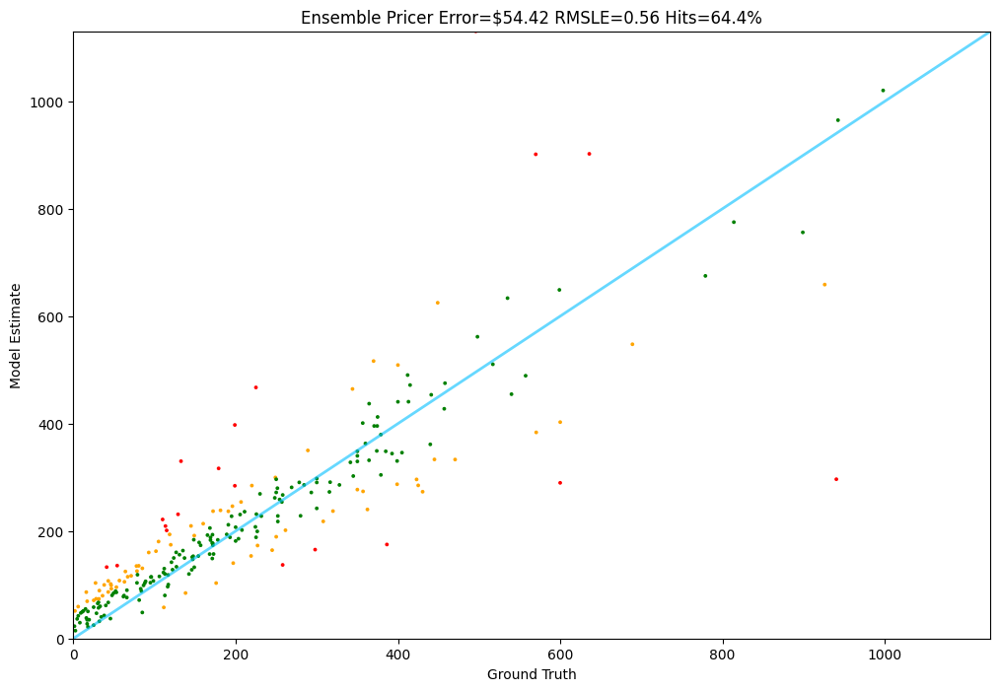

In [85]:
Tester.test(ensemble_pricer, test)